In [67]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import statistics
import math
import pandas_datareader as pdr

# Ploting
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from dataprep.eda import plot_correlation
import matplotlib.dates as mdates
from mpl_finance import candlestick_ohlc

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV,KFold
from sklearn.metrics import r2_score

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tools.sm_exceptions import ValueWarning, HessianInversionWarning, ConvergenceWarning
from xgboost import XGBRegressor
import xgboost as xgb

import datetime
from datetime import datetime, timedelta
import optuna
import yfinance as yf

from tqdm import tqdm
from prophet import Prophet
from pmdarima import auto_arima

from tensorflow.keras.models import Sequential
from keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from sklearn.metrics import mean_squared_error

from ta.momentum import RSIIndicator,StochasticOscillator
#from fastai.tabular import add_datepart

plt.style.use('ggplot')

# Importing the Dataset ---

In [119]:
df=pd.read_csv("E:\Projects\Project - Time Series & Forecasting - Stock Price Prediction\JKCEMENT.NS.csv")
df

,Date,Open,High,Low,Close,Adj Close,Volume
0,19-03-2019,844.000000,847.000000,826.549988,837.000000,811.172058,39378.0
1,20-03-2019,830.500000,851.000000,830.049988,837.750000,811.898926,25939.0
2,22-03-2019,849.950012,849.950012,831.049988,843.049988,817.035278,11156.0
3,25-03-2019,827.000000,838.950012,812.200012,820.000000,794.696655,21401.0
4,26-03-2019,819.250000,827.900024,807.599976,820.250000,794.938904,9780.0
...,...,...,...,...,...,...,...
1230,12-03-2024,4275.000000,4309.500000,4151.600098,4161.950195,4161.950195,229393.0
1231,13-03-2024,4171.950195,4198.649902,4051.050049,4086.199951,4086.199951,258244.0
1232,14-03-2024,4090.000000,4109.950195,4041.300049,4090.699951,4090.699951,110644.0
1233,15-03-2024,NaN,NaN,NaN,NaN,NaN,NaN


# EDA (Exploratory Data Analytics)

In [4]:
# Structure/Details regarding the imported Data-file(s) ---

type(df)

pandas.core.frame.DataFrame

In [17]:
df.shape

(1235, 7)

In [3]:
df.dtypes

Date          object
Open         float64
High         float64
Low          float64
Close        float64
Adj Close    float64
Volume       float64
dtype: object

In [4]:
df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [120]:
# Renaming Column/Variable/Feature names:
df.rename(
    columns = {"Adj Close": "Adj_Close",
               },
          inplace=True,
)
df

,Date,Open,High,Low,Close,Adj_Close,Volume
0,19-03-2019,844.000000,847.000000,826.549988,837.000000,811.172058,39378.0
1,20-03-2019,830.500000,851.000000,830.049988,837.750000,811.898926,25939.0
2,22-03-2019,849.950012,849.950012,831.049988,843.049988,817.035278,11156.0
3,25-03-2019,827.000000,838.950012,812.200012,820.000000,794.696655,21401.0
4,26-03-2019,819.250000,827.900024,807.599976,820.250000,794.938904,9780.0
...,...,...,...,...,...,...,...
1230,12-03-2024,4275.000000,4309.500000,4151.600098,4161.950195,4161.950195,229393.0
1231,13-03-2024,4171.950195,4198.649902,4051.050049,4086.199951,4086.199951,258244.0
1232,14-03-2024,4090.000000,4109.950195,4041.300049,4090.699951,4090.699951,110644.0
1233,15-03-2024,NaN,NaN,NaN,NaN,NaN,NaN


In [121]:
# Changing the format of Date Column---

df['Date'] = pd.to_datetime(df['Date'])

In [122]:
# Extract the month from the Date column

df['Month'] = df['Date'].dt.month
col = df.columns.tolist()
col.insert(1, col.pop()) 
df = df[col]

In [123]:
# Extract the year from the Date column

df['Year'] = df['Date'].dt.year

col = df.columns.tolist()
col.insert(2, col.pop()) 
df = df[col]

In [124]:
# Inserting a new variable in the dataset i.e. Quarter---

# Formatting the variable i.e. Quarter to a specified format ---
# Inserting the new variabl;e to a specified position/index within a dataframe ---


#df['Quarter'] = pd.PeriodIndex(df.Date, freq='Q')
df['Quarter'] = df['Date'].dt.quarter


col = df.columns.tolist()
col.insert(3, col.pop()) 
df = df[col]

In [125]:
df

,Date,Month,Year,Quarter,Open,High,Low,Close,Adj_Close,Volume
0,2019-03-19,3,2019,1,844.000000,847.000000,826.549988,837.000000,811.172058,39378.0
1,2019-03-20,3,2019,1,830.500000,851.000000,830.049988,837.750000,811.898926,25939.0
2,2019-03-22,3,2019,1,849.950012,849.950012,831.049988,843.049988,817.035278,11156.0
3,2019-03-25,3,2019,1,827.000000,838.950012,812.200012,820.000000,794.696655,21401.0
4,2019-03-26,3,2019,1,819.250000,827.900024,807.599976,820.250000,794.938904,9780.0
...,...,...,...,...,...,...,...,...,...,...
1230,2024-12-03,12,2024,4,4275.000000,4309.500000,4151.600098,4161.950195,4161.950195,229393.0
1231,2024-03-13,3,2024,1,4171.950195,4198.649902,4051.050049,4086.199951,4086.199951,258244.0
1232,2024-03-14,3,2024,1,4090.000000,4109.950195,4041.300049,4090.699951,4090.699951,110644.0
1233,2024-03-15,3,2024,1,NaN,NaN,NaN,NaN,NaN,NaN


In [525]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1235 entries, 0 to 1234
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1235 non-null   datetime64[ns]
 1   Month      1235 non-null   int64         
 2   Year       1235 non-null   int64         
 3   Quarter    1235 non-null   int64         
 4   Open       1234 non-null   float64       
 5   High       1234 non-null   float64       
 6   Low        1234 non-null   float64       
 7   Close      1234 non-null   float64       
 8   Adj_Close  1234 non-null   float64       
 9   Volume     1234 non-null   float64       
dtypes: datetime64[ns](1), float64(6), int64(3)
memory usage: 96.6 KB


In [255]:
# To identify any Null values in the given dataset ---

df.isnull().values.any()

True

In [13]:
# OR ---

df.isnull().sum()

Date         0
Month        0
Year         0
Quarter      0
Open         1
High         1
Low          1
Close        1
Adj_Close    1
Volume       1
dtype: int64

In [18]:
# Identification of rows containing missing values ---

# This will return a dataframe as follows---

nan_df = df.isna()
print(nan_df)

       Date  Month   Year  Quarter   Open   High    Low  Close  Adj_Close  \
0     False  False  False    False  False  False  False  False      False   
1     False  False  False    False  False  False  False  False      False   
2     False  False  False    False  False  False  False  False      False   
3     False  False  False    False  False  False  False  False      False   
4     False  False  False    False  False  False  False  False      False   
...     ...    ...    ...      ...    ...    ...    ...    ...        ...   
1230  False  False  False    False  False  False  False  False      False   
1231  False  False  False    False  False  False  False  False      False   
1232  False  False  False    False  False  False  False  False      False   
1233  False  False  False    False   True   True   True   True       True   
1234  False  False  False    False  False  False  False  False      False   

      Volume  
0      False  
1      False  
2      False  
3      False  


In [14]:
# To identify rows with missing values ---

nan_rows = df.isna().any(axis=1)
print(nan_rows)

0       False
1       False
2       False
3       False
4       False
        ...  
1230    False
1231    False
1232    False
1233     True
1234    False
Length: 1235, dtype: bool


  0%|                                                                                          | 0/142 [00:00<…


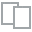
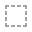
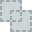
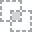
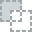
...
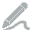
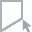
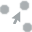
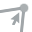
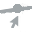

In [15]:
# Analyze Missing Values ---

from dataprep.eda import plot_missing
plot_missing(df)

In [16]:
def eda(df):
    eda_df = pd.DataFrame(df.dtypes, columns=['dtypes'])
    eda_df['Unique_Values'] = df.nunique().values
    eda_df['Missing_Values'] = df.isna().sum()
    eda_df['%_of_Missing_Values'] = (df.isna().sum())/len(df)
    eda_df['count'] = df.count().values
    return eda_df

In [17]:
eda(df).style.background_gradient(cmap='Reds')

,dtypes,Unique_Values,Missing_Values,%_of_Missing_Values,count
Date,datetime64[ns],1235,0,0.000000,1235
Month,int64,12,0,0.000000,1235
Year,int64,6,0,0.000000,1235
Quarter,int64,4,0,0.000000,1235
Open,float64,1094,1,0.000810,1234
High,float64,1130,1,0.000810,1234
Low,float64,1154,1,0.000810,1234
Close,float64,1221,1,0.000810,1234
Adj_Close,float64,1226,1,0.000810,1234
Volume,float64,1229,1,0.000810,1234


In [126]:
# To drop & remove rows (or a specific row) containing null values ---

df = df.dropna(how='any',axis=0) 

In [127]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1234 entries, 0 to 1234
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       1234 non-null   datetime64[ns]
 1   Month      1234 non-null   int64         
 2   Year       1234 non-null   int64         
 3   Quarter    1234 non-null   int64         
 4   Open       1234 non-null   float64       
 5   High       1234 non-null   float64       
 6   Low        1234 non-null   float64       
 7   Close      1234 non-null   float64       
 8   Adj_Close  1234 non-null   float64       
 9   Volume     1234 non-null   float64       
dtypes: datetime64[ns](1), float64(6), int64(3)
memory usage: 106.0 KB


In [33]:
df.describe()

,Month,Year,Quarter,Open,High,Low,Close,Adj_Close,Volume
count,1234.000000,1234.000000,1234.000000,1234.000000,1234.000000,1234.000000,1234.000000,1234.000000,1.234000e+03
mean,6.557536,2021.213128,2.515397,2401.156440,2439.203808,2361.372044,2398.642505,2376.399844,1.100311e+05
std,3.435705,1.466287,1.112565,957.852784,969.722181,944.683971,955.833634,958.650958,1.027601e+05
min,1.000000,2019.000000,1.000000,817.000000,827.900024,795.250000,820.000000,794.696655,3.647000e+03
25%,4.000000,2020.000000,2.000000,1418.500000,1438.424988,1400.000000,1418.750030,1391.448212,4.761350e+04
50%,7.000000,2021.000000,3.000000,2687.400024,2735.250000,2635.250000,2687.650024,2664.857788,8.296250e+04
75%,9.750000,2022.000000,3.750000,3159.962524,3211.424926,3120.000000,3158.362549,3143.124939,1.346980e+05
max,12.000000,2024.000000,4.000000,4552.350098,4555.000000,4489.799805,4514.899902,4514.899902,1.228213e+06


In [93]:
# Setting the Date Column as an Index---

# df = df.set_index('Date')

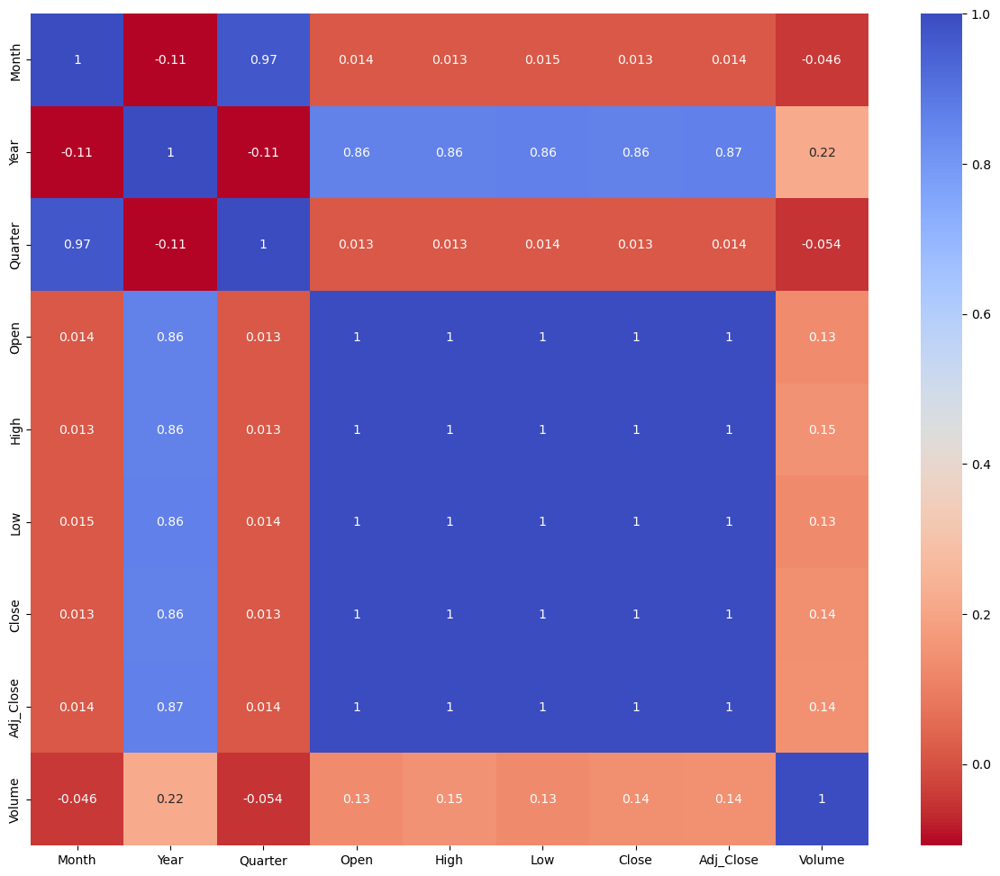

In [160]:
#  Heat Map/Correlogram ---

plt.figure(figsize=(15,12))
corr = df.corr()
sns.heatmap(corr, cmap="coolwarm_r", annot=True)
plt.show()


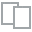
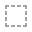
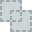
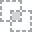
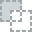
...
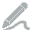
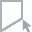
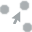
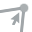
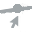

In [161]:
plot_correlation(df)

  0%|                                                                                         | 0/1593 [00:00<…

DataPrep Report
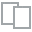
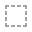
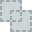
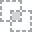
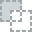
...
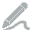
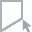
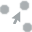
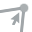
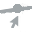

In [162]:
from dataprep.datasets import load_dataset
# importing function from DataPrep.eda
from dataprep.eda import create_report

create_report(df)

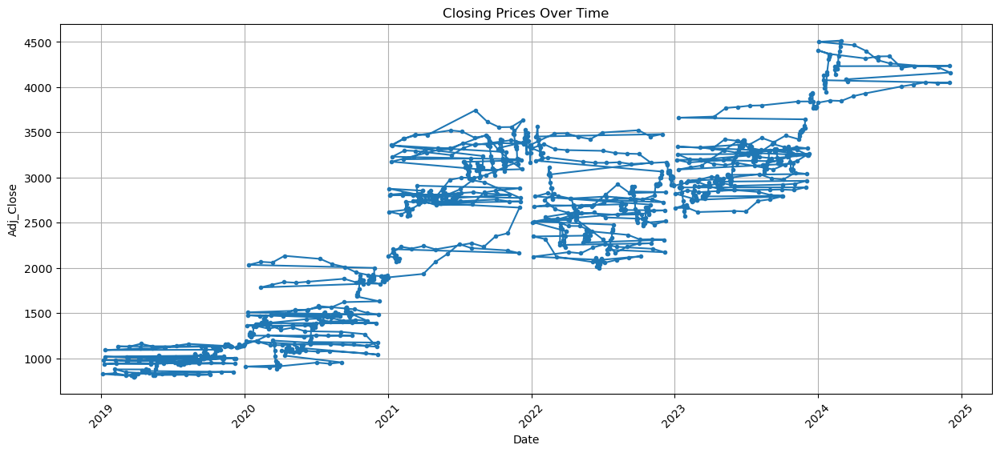

In [30]:
# Line Chart of Closing Prices Over Time

# Convert 'Date' column to datetime
df['Date'] = pd.to_datetime(df['Date'])

plt.figure(figsize=(15, 6))
plt.plot(df['Date'], df['Adj_Close'], marker='.')
plt.title('Closing Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Adj_Close')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

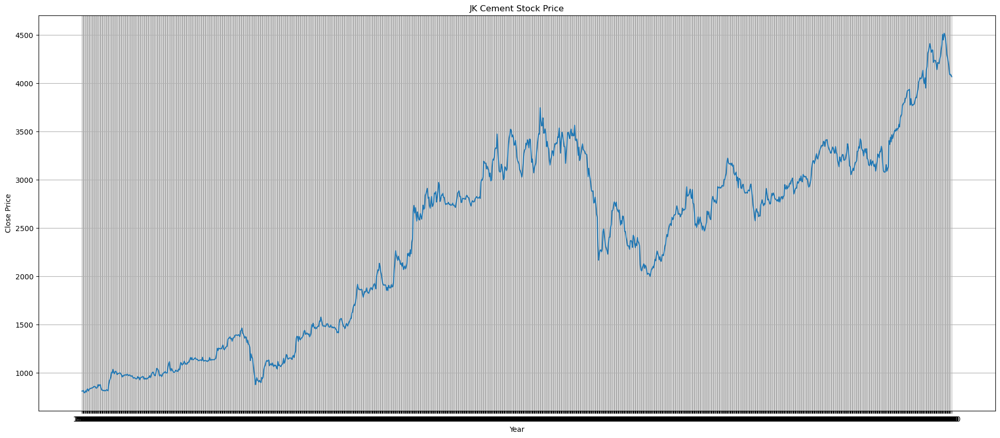

In [54]:
plt.figure(figsize=(24,10))
plt.plot(df['Adj_Close'])
plt.grid()
plt.xlabel('Year')
plt.ylabel('Close Price')
plt.title('JK Cement Stock Price')

# Derive the years for x-axis labels
years = pd.to_datetime(df.index).year
plt.xticks(ticks=df.index, labels=years)

plt.show()

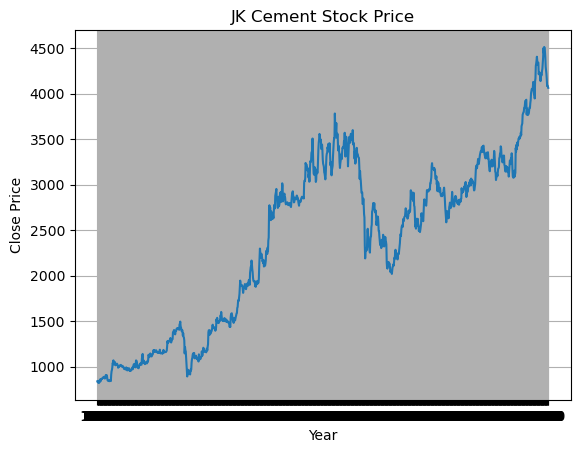

In [61]:
years = pd.to_datetime(df.index).year
plt.xticks(ticks=df.index, labels=years)

plt.plot(df['Close'])
plt.grid()
plt.xlabel('Year')
plt.ylabel('Close Price')
plt.title('JK Cement Stock Price')
plt.show()

<Figure size 2400x1600 with 0 Axes>

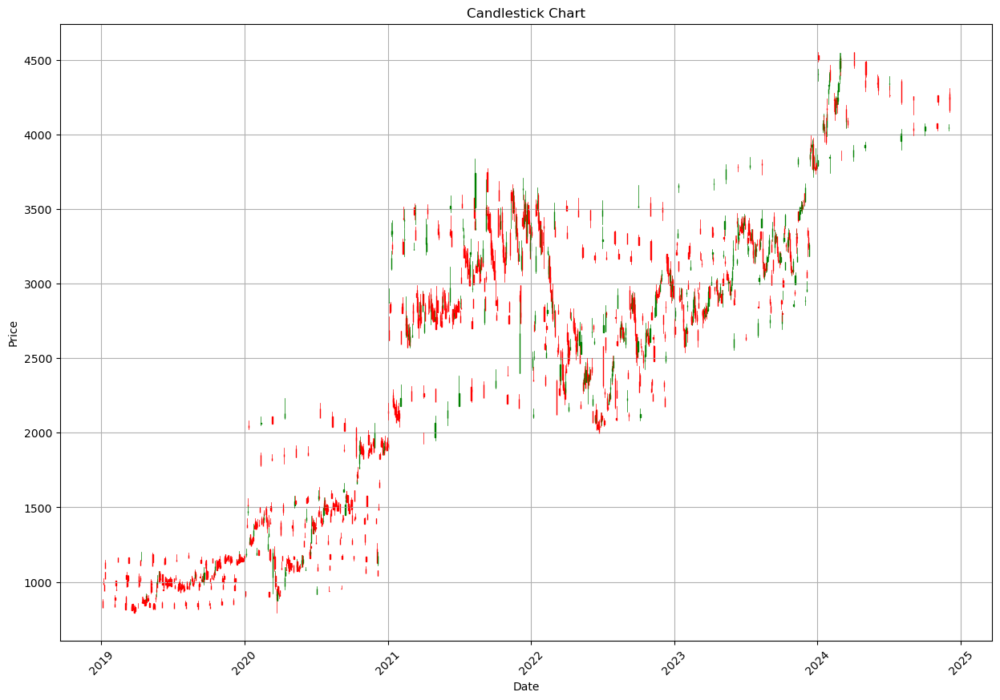

In [27]:
# Candlestick Chart ---

plt.figure(figsize=(24, 16))

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_finance import candlestick_ohlc
import numpy as np

# Convert 'Date' column to matplotlib date format
matplotlib_date = mdates.date2num(df['Date'])

# Create an array of tuples in the required format
ohlc = np.vstack((matplotlib_date, df['Open'], df['High'], df['Low'], df['Adj_Close'])).T

plt.figure(figsize=(15, 10))
ax = plt.subplot()
candlestick_ohlc(ax, ohlc, width=0.6, colorup='g', colordown='r')
ax.xaxis_date()
plt.title('Candlestick Chart')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

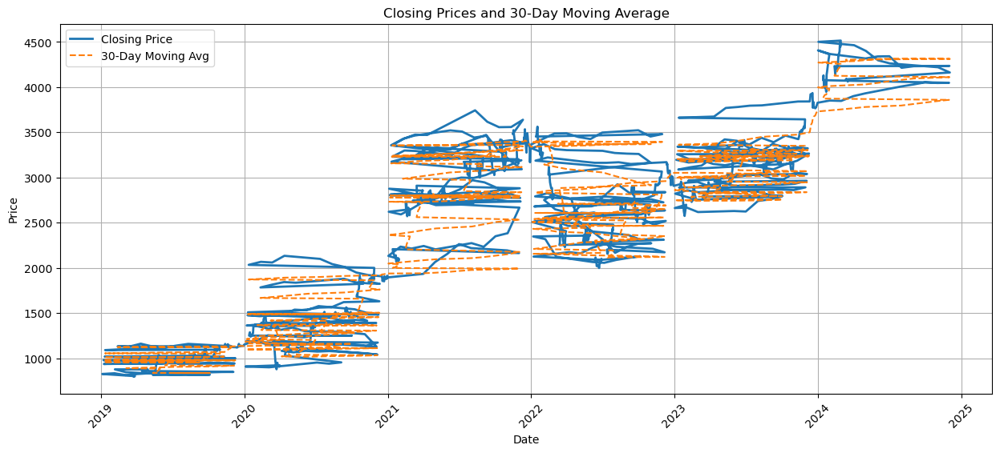

In [31]:
# Closing Prices and Moving Average plots---

window = 30
plt.figure(figsize=(15, 6))
plt.plot(df['Date'], df['Adj_Close'], label='Closing Price', linewidth=2)
plt.plot(df['Date'], df['Adj_Close'].rolling(window=window).mean(), label=f'{window}-Day Moving Avg', linestyle='--')
plt.title(f'Closing Prices and {window}-Day Moving Average')
plt.xlabel('Date')
plt.ylabel('Price')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()

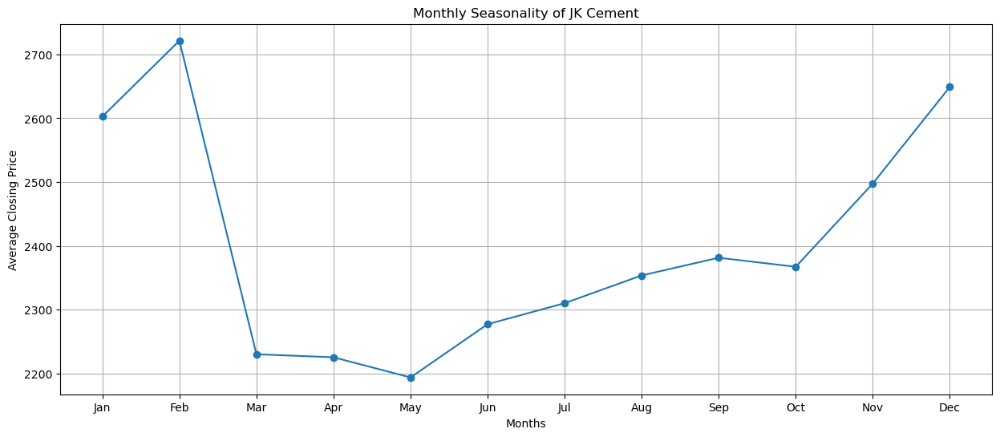

In [32]:
# Monthly Seasonality of Closing Prices
df['Month'] = df['Date'].dt.month

monthly_average = df.groupby('Month')['Close'].mean()

plt.figure(figsize=(15, 6))
plt.plot(monthly_average.index, monthly_average.values, marker='o')
plt.title(f'Monthly Seasonality of JK Cement')
plt.xlabel('Months')
plt.ylabel('Average Closing Price')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()

In [34]:
new_df = df.reset_index()['Close']
new_df

0        837.000000
1        837.750000
2        843.049988
3        820.000000
4        820.250000
           ...     
1229    4219.950195
1230    4161.950195
1231    4086.199951
1232    4090.699951
1233    4064.850098
Name: Close, Length: 1234, dtype: float64

In [35]:
# Normalizing our data using MinMaxScaler
scaler = MinMaxScaler()
scaled_data=scaler.fit_transform(np.array(new_df).reshape(-1,1))

# Train-Test Split ---

In [36]:
# Set seed for reproducibility
np.random.seed(42)

# Split into training and testing sets
train_size = int(len(scaled_data) * 0.7)  # 70% for training
train_data, test_data = scaled_data[:train_size], scaled_data[train_size:]

In [37]:
train_data

array([[4.60093655e-03],
       [4.80391904e-03],
       [6.23832542e-03],
       [0.00000000e+00],
       [6.76608316e-05],
       [4.93924071e-03],
       [1.85390029e-03],
       [8.52526478e-03],
       [1.07986752e-02],
       [4.97984370e-03],
       [8.47113287e-03],
       [1.08257331e-02],
       [1.26255177e-02],
       [1.21789497e-02],
       [1.35592242e-02],
       [1.46012107e-02],
       [1.48989119e-02],
       [1.79030625e-02],
       [1.78218565e-02],
       [1.73211729e-02],
       [1.35186374e-02],
       [1.31803332e-02],
       [1.52372160e-02],
       [2.30994014e-02],
       [1.95945833e-02],
       [2.25581148e-02],
       [2.28423032e-02],
       [1.41275849e-02],
       [8.05163896e-03],
       [6.94200782e-03],
       [7.11791624e-03],
       [5.50758520e-03],
       [6.59015850e-03],
       [5.23694187e-03],
       [6.95553673e-03],
       [8.49820694e-03],
       [6.86080183e-03],
       [5.48052736e-03],
       [2.45879397e-02],
       [3.46288169e-02],


# LSTM (Long-Short Term Memory)

## Preparing sequences for LSTM ---

In [38]:
# Define the sequence length (number of past time steps)

# Using a value of n_past = 60 means that we are considering the past 90 time steps (or observations) to predict the 
# next time step. 
#This choice of sequence length is often based on empirical experimentation and domain knowledge.

# In time series forecasting tasks, choosing an appropriate sequence length is important because it determines how much 
# historical context the model can consider when making predictions. 
# A longer sequence length allows the model to capture more complex patterns and dependencies in the data but may 
# also increase computational complexity and training time. 
# Conversely, a shorter sequence length may lead to simpler models but may not capture long-term dependencies effectively.


# # Define the sequence length (number of past time steps) 
n_past = 90

# Prepare sequences for LSTM
X_train, y_train = [], []
for i in range(n_past, len(train_data)):
    X_train.append(train_data[i - n_past:i, 0])
    y_train.append(train_data[i, 0])
X_train, y_train = np.array(X_train), np.array(y_train)


# Similarly prepare sequences for the test set
X_test, y_test = [], []
for i in range(n_past, len(test_data)):
    X_test.append(test_data[i - n_past:i, 0])
    y_test.append(test_data[i, 0])
X_test, y_test = np.array(X_test), np.array(y_test)

In [39]:
print("Training set size:-")
print(X_train.shape), print(y_train.shape)
print("\n")

print("Testing set size:-")
print(X_test.shape), print(y_test.shape)

Training set size:-
(773, 90)
(773,)


Testing set size:-
(281, 90)
(281,)


(None, None)

In [40]:
# Reshape input data for LSTM([samples, time steps, features])

X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

In [41]:
X_train

array([[[4.60093655e-03],
        [4.80391904e-03],
        [6.23832542e-03],
        ...,
        [4.32758744e-02],
        [3.61444130e-02],
        [3.95139256e-02]],

       [[4.80391904e-03],
        [6.23832542e-03],
        [0.00000000e+00],
        ...,
        [3.61444130e-02],
        [3.95139256e-02],
        [3.66451129e-02]],

       [[6.23832542e-03],
        [0.00000000e+00],
        [6.76608316e-05],
        ...,
        [3.95139256e-02],
        [3.66451129e-02],
        [3.86884667e-02]],

       ...,

       [[4.51987900e-01],
        [4.51527820e-01],
        [4.35221560e-01],
        ...,
        [5.41611411e-01],
        [5.73317317e-01],
        [5.46888956e-01]],

       [[4.51527820e-01],
        [4.35221560e-01],
        [4.24612288e-01],
        ...,
        [5.73317317e-01],
        [5.46888956e-01],
        [5.49500704e-01]],

       [[4.35221560e-01],
        [4.24612288e-01],
        [4.10809479e-01],
        ...,
        [5.46888956e-01],
        [5.4950

# LSTM Model Training ---

In [42]:
# Initialize a sequential model
model = Sequential()

# First LSTM layer with 50 units, input shape, and return sequences
model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))

# Adding dropout to prevent overfitting
model.add(Dropout(0.2))         

# Second LSTM layer with 50 units and return sequences
model.add(LSTM(units=50, return_sequences=True))
model.add(Dropout(0.2))

# Third LSTM layer with 50 units
model.add(LSTM(units=50))
model.add(Dropout(0.2))

# Add a dense output layer with one unit
model.add(Dense(units=1))

From E:\Anaconda\lib\site-packages\keras\src\backend.py:873: The name tf.get_default_graph is deprecated. Please use tf.compat.v1.get_default_graph instead.



In [43]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 90, 50)            10400     
                                                                 
 dropout (Dropout)           (None, 90, 50)            0         
                                                                 
 lstm_1 (LSTM)               (None, 90, 50)            20200     
                                                                 
 dropout_1 (Dropout)         (None, 90, 50)            0         
                                                                 
 lstm_2 (LSTM)               (None, 50)                20200     
                                                                 
 dropout_2 (Dropout)         (None, 50)                0         
                                                                 
 dense (Dense)               (None, 1)                 5

In [45]:
model.compile(loss='mean_squared_error',optimizer='adam')

In [46]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

# Defining our callbacks
checkpoints = ModelCheckpoint(filepath='my_weights.h5', save_best_only=True)
# Defining our early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

# Training our LSTM model
model.fit(X_train, y_train,
          validation_data=(X_test, y_test),
          epochs=100,
          batch_size=32,
          verbose=1,
          callbacks=[checkpoints, early_stopping])

Epoch 1/100


From E:\Anaconda\lib\site-packages\keras\src\utils\tf_utils.py:492: The name tf.ragged.RaggedTensorValue is deprecated. Please use tf.compat.v1.ragged.RaggedTensorValue instead.



25/25 [==============================] - 19s 296ms/step - loss: 0.0295 - val_loss: 0.0032
Epoch 2/100
25/25 [==============================] - 5s 190ms/step - loss: 0.0051 - val_loss: 0.0026
Epoch 3/100
25/25 [==============================] - 5s 186ms/step - loss: 0.0041 - val_loss: 0.0036
Epoch 4/100
25/25 [==============================] - 5s 191ms/step - loss: 0.0050 - val_loss: 0.0025
Epoch 5/100
25/25 [==============================] - 5s 186ms/step - loss: 0.0037 - val_loss: 0.0043
Epoch 6/100
25/25 [==============================] - 5s 188ms/step - loss: 0.0037 - val_loss: 0.0043
Epoch 7/100
25/25 [==============================] - 5s 190ms/step - loss: 0.0031 - val_loss: 0.0017
Epoch 8/100
25/25 [==============================] - 5s 189ms/step - loss: 0.0034 - val_loss: 0.0017
Epoch 9/100
25/25 [==============================] - 5s 184ms/step - loss: 0.0033 - val_loss: 0.0018
Epoch 10/100
25/25 [==============================] - 5s 188ms/step - loss: 0.0030 - val_loss: 0.0034


Epoch 81/100
25/25 [==============================] - 5s 185ms/step - loss: 0.0012 - val_loss: 6.7539e-04
Epoch 82/100
25/25 [==============================] - 5s 187ms/step - loss: 0.0010 - val_loss: 5.4627e-04
Epoch 83/100
25/25 [==============================] - 5s 184ms/step - loss: 0.0012 - val_loss: 7.5015e-04
Epoch 84/100
25/25 [==============================] - 5s 183ms/step - loss: 0.0011 - val_loss: 0.0015
Epoch 85/100
25/25 [==============================] - 5s 183ms/step - loss: 0.0013 - val_loss: 0.0010
Epoch 86/100
25/25 [==============================] - 5s 184ms/step - loss: 0.0011 - val_loss: 7.1353e-04
Epoch 87/100
25/25 [==============================] - 5s 185ms/step - loss: 0.0011 - val_loss: 4.2805e-04
Epoch 88/100
25/25 [==============================] - 5s 185ms/step - loss: 0.0012 - val_loss: 9.0924e-04
Epoch 89/100
25/25 [==============================] - 5s 187ms/step - loss: 0.0014 - val_loss: 0.0014
Epoch 90/100
25/25 [==============================] - 5s 1

In [47]:
# Let's do the prediction and check performance metrics---

train_predict = model.predict(X_train)
test_predict = model.predict(X_test)

9/9 [==============================] - 1s 56ms/step


In [48]:
# Transform back to original form ---

train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

# LSTM algorithm's Performance Metrics

In [49]:
# Calculate train data RMSE
print(math.sqrt(mean_squared_error(y_train,train_predict)))

# Calculate test data RMSE
print(math.sqrt(mean_squared_error(y_test,test_predict)))

2293.316006109963
3301.8618793070546


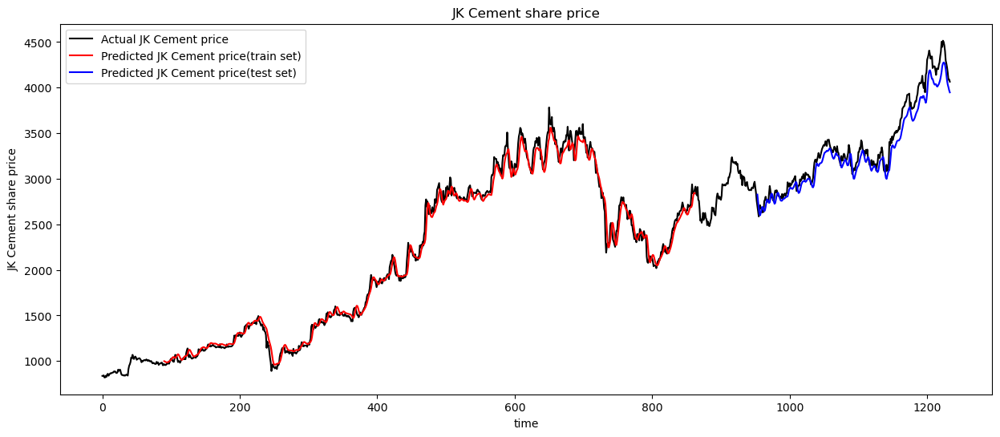

In [50]:
# Set the number of previous time steps to consider for plotting
look_back = 90

# Initialize an array for plotting the train predictions
trainPredictPlot = np.empty_like(new_df)
trainPredictPlot[:] = np.nan
# Assign the predicted values to the appropriate location for train predictions
trainPredictPlot[look_back:len(train_predict)+look_back] = train_predict.flatten()

# Initialize an array for plotting the test predictions
testPredictPlot = np.empty_like(new_df)
testPredictPlot[:] = np.nan
# Calculate the starting index for the test predictions
test_start = len(new_df) - len(test_predict)
# Assign the predicted values to the appropriate location for test predictions
testPredictPlot[test_start:] = test_predict.flatten()

# Rescale the scaled data back to its original scale using the scaler
original_scaled_data = scaler.inverse_transform(scaled_data)

# Plotting the baseline data, training predictions, and test predictions
plt.figure(figsize=(15, 6))
plt.plot(original_scaled_data, color='black', label=f"Actual {'JK Cement'} price")
plt.plot(trainPredictPlot, color='red', label=f"Predicted {'JK Cement'} price(train set)")
plt.plot(testPredictPlot, color='blue', label=f"Predicted {'JK Cement'} price(test set)")

plt.title(f"{'JK Cement'} share price")
plt.xlabel("time")
plt.ylabel(f"{'JK Cement'} share price")
plt.legend()
plt.show()

In [51]:
# To predict for the next 30 days, you'll need the last n_past days of data
last_sequence = X_test[-1]

# Reshape the last_sequence to match the input shape of the model
last_sequence = last_sequence.reshape(1, n_past, 1)

# Generate predictions for the next 10 days
predictions_next_30_days = []
for _ in range(30):
    next_day_prediction = model.predict(last_sequence)
    predictions_next_30_days.append(next_day_prediction[0, 0])  # Get the predicted value
    last_sequence = np.roll(last_sequence, -1, axis=1)  # Shift the sequence by one day
    last_sequence[0, -1, 0] = next_day_prediction  # Update the last element with the new prediction

# Transform the predictions back to the original scale
predictions_next_30_days = scaler.inverse_transform(np.array(predictions_next_30_days).reshape(-1, 1))

# Print the predictions for the next 10 days
print("Predictions for the next 30 days:")
for i, prediction in enumerate(predictions_next_30_days, start=1):
    print(f"Day {i}: Predicted Price = {prediction[0]}")

1/1 [==============================] - 0s 80ms/step
Predictions for the next 30 days:
Day 1: Predicted Price = 3947.496337890625
Day 2: Predicted Price = 3897.914794921875
Day 3: Predicted Price = 3833.76171875
Day 4: Predicted Price = 3768.899169921875
Day 5: Predicted Price = 3710.8037109375
Day 6: Predicted Price = 3661.390625
Day 7: Predicted Price = 3619.723876953125
Day 8: Predicted Price = 3584.00537109375
Day 9: Predicted Price = 3552.511474609375
Day 10: Predicted Price = 3523.865966796875
Day 11: Predicted Price = 3497.04150390625
Day 12: Predicted Price = 3471.29443359375
Day 13: Predicted Price = 3446.11572265625
Day 14: Predicted Price = 3421.1884765625
Day 15: Predicted Price = 3396.3564453125
Day 16: Predicted Price = 3371.584716796875
Day 17: Predicted Price = 3346.9267578125
Day 18: Predicted Price = 3322.48681640625
Day 19: Predicted Price = 3298.38916015625
Day 20: Predicted Price = 3274.75830078125
Day 21: Predicted Price = 3251.700439453125
Day 22: Predicted Price 

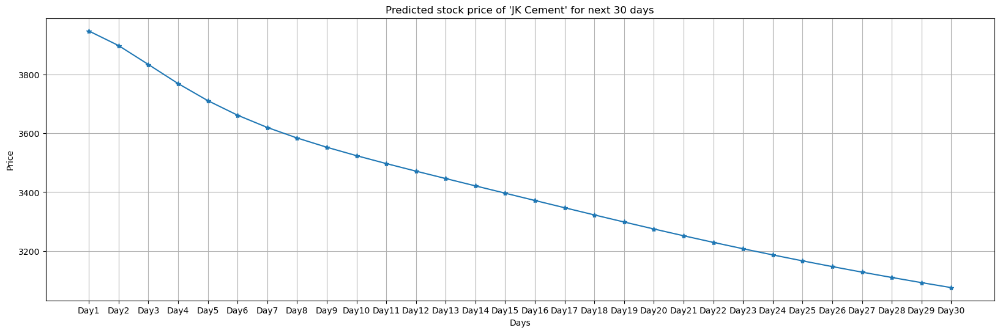

In [52]:
plt.figure(figsize=(20, 6))  # Adjust the width (12) as needed

plt.plot(predictions_next_30_days, marker='*')
plt.title("Predicted stock price of 'JK Cement' for next 30 days")
plt.xlabel('Days')
plt.ylabel('Price')
plt.xticks(range(0, 30), ['Day1', 'Day2', 'Day3', 'Day4', 'Day5', 'Day6', 'Day7', 'Day8', 'Day9', 'Day10',
                          'Day11', 'Day12', 'Day13', 'Day14', 'Day15', 'Day16', 'Day17', 'Day18', 'Day19', 'Day20',
                          'Day21', 'Day22', 'Day23', 'Day24', 'Day25', 'Day26', 'Day27', 'Day28', 'Day29', 'Day30'])
plt.grid(True)
plt.show()


# Moving Averages ---


## a) Simple Moving Average ---

In [ ]:
# A moving average (MA) is a stock indicator commonly used in technical analysis. 
# Reasons for calculating moving average of a stock is to help smooth out the price data by creating 
# a constantly updated average price.

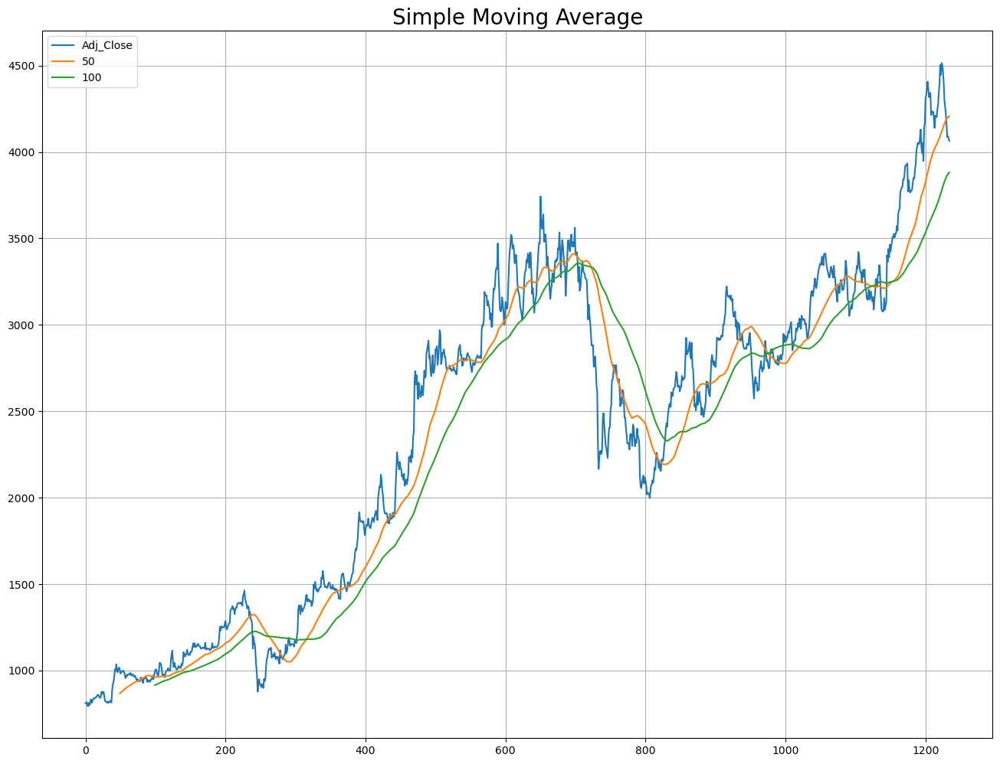

In [13]:
adj_close_px = df['Adj_Close']
df['50'] = adj_close_px.rolling(window=50).mean()
df['100'] = adj_close_px.rolling(window=100).mean()

plt.figure(figsize=(16,12))
plt.plot(df['Adj_Close'], label='Adj_Close')
plt.plot(df['50'], label='50')
plt.plot(df['100'], label='100')
plt.title('Simple Moving Average', fontsize=20)
plt.grid()
plt.legend()
plt.show()

## b) Exponential Moving Average ---

In [ ]:
# Exponential Moving Average (EMA) gives more weightage to the recent prices so as to make them more responsive 
# to new information that helps in updating the data.

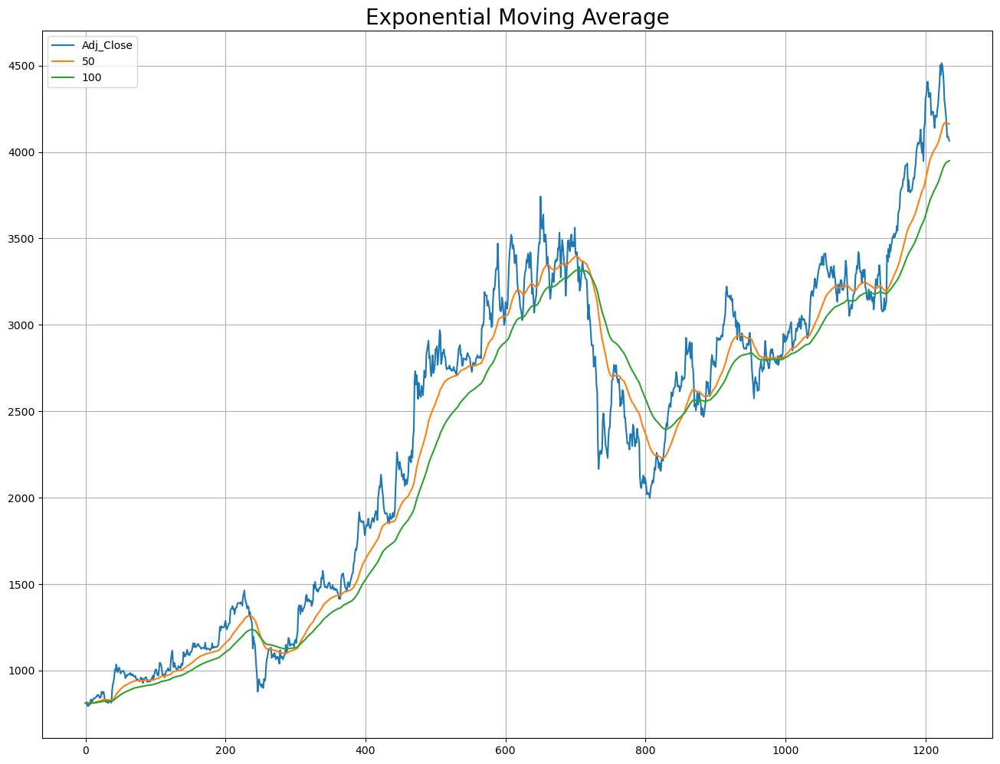

In [14]:
plt.figure(figsize=(16,12))
plt.plot(adj_close_px, label='Adj_Close')
plt.plot(adj_close_px.ewm(span=50, adjust=False).mean(), label='50')
plt.plot(adj_close_px.ewm(span=100, adjust=False).mean(), label='100')
plt.title('Exponential Moving Average', fontsize=20)
plt.legend()
plt.grid()
plt.show()

# Volatility Calculation of a Stock ---

In [15]:
daily_close = df[['Adj_Close']]
daily_pct_c = daily_close.pct_change()
daily_pct_c.fillna(0, inplace=True)
print(daily_pct_c)

      Adj_Close
0      0.000000
1      0.000896
2      0.006326
3     -0.027341
4      0.000305
...         ...
1229  -0.010006
1230  -0.013744
1231  -0.018201
1232   0.001101
1234  -0.006319

[1234 rows x 1 columns]


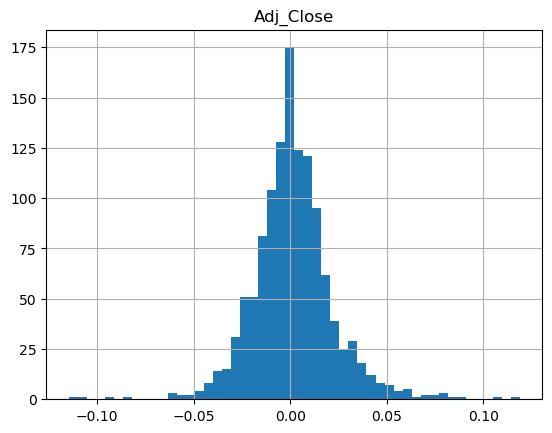

         Adj_Close
count  1234.000000
mean      0.001523
std       0.020853
min      -0.114693
25%      -0.009590
50%       0.000745
75%       0.011607
max       0.118819


In [16]:
daily_pct_c.hist(bins=50)
plt.show()
print(daily_pct_c.describe())

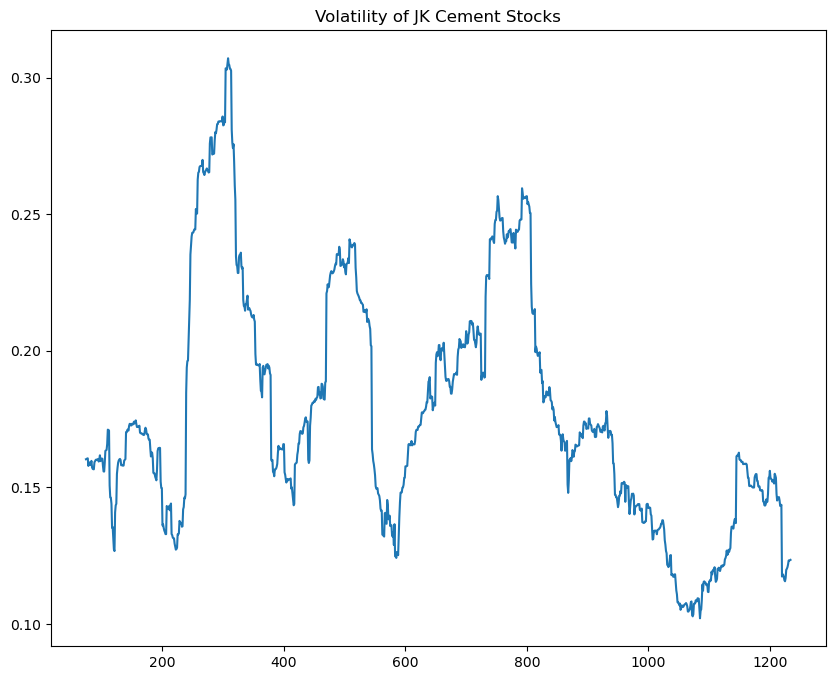

In [17]:
min_periods = 75 
vol = daily_pct_c.rolling(min_periods).std() * np.sqrt(min_periods) 
plt.figure(figsize=(10, 8))
plt.plot(vol)
plt.title('Volatility of JK Cement Stocks')
plt.show()

# Trading Strategy ---

## Moving Average Crossover ---

In [18]:
short_window = 13
long_window = 49

signals = pd.DataFrame(index=df.index)
signals['signal'] = 0.0

signals['short_mavg'] = df['Close'].rolling(window=short_window, min_periods=1, center=False).mean()
signals['long_mavg'] = df['Close'].rolling(window=long_window, min_periods=1, center=False).mean()
signals['signal'][short_window:] = np.where(signals['short_mavg'][short_window:] 
                                            > signals['long_mavg'][short_window:], 1.0, 0.0)   

signals['positions'] = signals['signal'].diff()

In [21]:
signals

,signal,short_mavg,long_mavg,positions
0,0.0,837.000000,837.000000,NaN
1,0.0,837.375000,837.375000,0.0
2,0.0,839.266663,839.266663,0.0
3,0.0,834.449997,834.449997,0.0
4,0.0,831.609998,831.609998,0.0
...,...,...,...,...
1229,1.0,4375.015400,4191.389818,0.0
1230,1.0,4368.253869,4199.016352,0.0
1231,1.0,4353.661565,4204.302067,0.0
1232,1.0,4334.203876,4209.185741,0.0


In [36]:
# Here I Choose to continue with only Close value column since that is what we care about 
df.drop(columns=['Open', 'High', 'Low', 'Adj_Close', 'Volume'],inplace=True)


num_days_pred = 30 # Number of days you want to predict in the future the higher the less accuracy

# Function to calculate mean absolute error percentage
def mean_absolute_percentage_error(y_true, y_pred): 
    """Calculates MAPE given y_true and y_pred"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def add_lags(df,num_days_pred=num_days_pred):
    target = 'Close'
    df['lag1'] = df[target].shift(num_days_pred)  
    df['lag2'] = df[target].shift(num_days_pred*2)    
    df['lag3'] = df[target].shift(num_days_pred*3)    
    df['lag4'] = df[target].shift(num_days_pred*4)    
    df['lag5'] = df[target].shift(num_days_pred*5)
    df['lag6'] = df[target].shift(num_days_pred*6)
    df['lag7'] = df[target].shift(num_days_pred*7)
    df['lag8'] = df[target].shift(num_days_pred*8)
    df['lag9'] = df[target].shift(num_days_pred*9)
    df['lag10'] = df[target].shift(num_days_pred*10)
    df['lag11'] = df[target].shift(num_days_pred*11)
    df['lag12'] = df[target].shift(num_days_pred*12)

    return df

# XG Boost (Extra - Gradient Boosting)

In [ ]:
# XGBoost can effectively handle seasonality and trends in time-series data. 
# Seasonal features can be incorporated into the model to capture periodic patterns, while trend features can capture
# long-term upward or downward trends. 
# By considering seasonality and trends, XGBoost can provide more accurate forecasts

In [37]:
df

,Date,Month,Year,Quarter,Close
0,2019-03-19,3,2019,1,837.000000
1,2019-03-20,3,2019,1,837.750000
2,2019-03-22,3,2019,1,843.049988
3,2019-03-25,3,2019,1,820.000000
4,2019-03-26,3,2019,1,820.250000
...,...,...,...,...,...
1229,2024-11-03,11,2024,4,4219.950195
1230,2024-12-03,12,2024,4,4161.950195
1231,2024-03-13,3,2024,1,4086.199951
1232,2024-03-14,3,2024,1,4090.699951


In [42]:
from statsmodels.tsa.stattools import adfuller

# Extract the 'Adj_Close' column as the target variable 'y'
y = df['Close']

# Perform Augmented Dickey-Fuller test on the target variable
adf_result = adfuller(y)

# Extract the p-value from the test result
p_value = adf_result[1]

# Check if the time series is stationary based on the p-value
if p_value < 0.05:
    print("The time series is stationary.")
else:
    print("The time series is not stationary.")


The time series is not stationary.


In [43]:
# ADF Test
# Function to print out results in customised manner
from statsmodels.tsa.stattools import adfuller
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)


In [44]:
adf_test(df['Close'])

Results of Dickey-Fuller Test:
Test Statistic                   -0.708536
p-value                           0.844526
#Lags Used                       12.000000
Number of Observations Used    1221.000000
Critical Value (1%)              -3.435717
Critical Value (5%)              -2.863910
Critical Value (10%)             -2.568032
dtype: float64


In [45]:
# Perform square root transformation
df_log = np.sqrt(df['Close'])

In [46]:
# Apply differencing
df_diff = df_log.diff().dropna()

In [47]:
# Checking the stationarity--

# Augmented Dickey-Fuller (ADF) Test:

result = adfuller(df_diff)
print('Test Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

Test Statistic: -10.808066
p-value: 0.000000
Critical values:
	1%: -3.436
	5%: -2.864
	10%: -2.568


### Test Statistic > Critical Value and p-value < 0.05. As a result, we reject the Null hypothesis in favor of an Alternative.

#  Plot the differenced time series

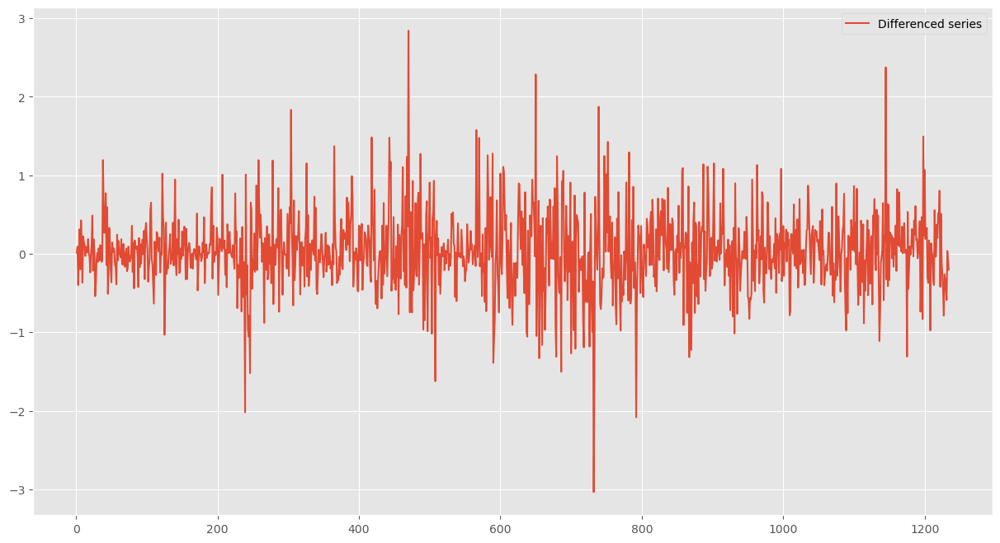

In [48]:
plt.figure(figsize=(15, 8))
plt.plot(df_diff, label="Differenced series")
plt.legend()
plt.show()

In [ ]:
# For creating Lag Features ---

In [50]:
def create_lag_features(df, lag_steps=1):
    for i in range(1, lag_steps + 1):
        df[f'lag_{i}'] = df['Close'].shift(i)
    return df

# Applying lag feature creation to the dataset
lagged_data = create_lag_features(df, lag_steps=3)

In [ ]:
# For creating Rolling Mean---

In [51]:
# Creating rolling mean for time-series data

def create_rolling_mean(df, window_size=10):
    df['rolling_mean'] = df['Close'].rolling(window=window_size).mean()
    return df

# Applying rolling mean to the dataset
rolled_data = create_rolling_mean(df, window_size=15)

In [ ]:
# Fourier Transform ---

In [52]:
from scipy.fft import fft

def apply_fourier_transform(df):

    values = df['Close'].values

    fourier_transform = fft(values)

    df['fourier_transform'] = np.abs(fourier_transform)

    return df

# Applying Fourier transformation to the dataset

fourier_data = apply_fourier_transform(df)

In [53]:
# Splitting time-series data into training and testing sets

train_size = int(len(df) * 0.7)

train_data, test_data = df[:train_size], df[train_size:]

In [54]:
# Hyperparameter tuning using Grid Search ---

In [57]:
import pandas as pd
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor

# Convert 'Date' column to datetime type if needed
df['Date'] = pd.to_datetime(df['Date'])

# Convert 'Date' column to numerical representation (number of days since the start date)
df['Date'] = (df['Date'] - df['Date'].min()).dt.days

# Define X and y
X = df.drop(columns=['Close'])  # Assuming 'Adj_Close' is the target variable
y = df['Close']

# Hyperparameter tuning using grid search
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 0.9, 1.0]
}

grid_search = GridSearchCV(XGBRegressor(), param_grid, cv=3)
grid_search.fit(X, y)

best_params = grid_search.best_params_
best_params

{'learning_rate': 0.2, 'max_depth': 3, 'subsample': 0.8}

In [59]:
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize XGBRegressor with best_params
xgb_model = XGBRegressor(learning_rate=best_params['learning_rate'],
                         max_depth=best_params['max_depth'],
                         subsample=best_params['subsample'])

# Fit the model to the training data
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.2, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=3, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

# Evaluating the Model's performance using XG Boost---

In [60]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

predictions = xgb_model.predict(X_test)

mae = mean_absolute_error(y_test, predictions)

rmse = np.sqrt(mean_squared_error(y_test, predictions))

r_squared = r2_score(y_test, predictions)

# Calculate MAPE
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(y_test, predictions)

In [221]:
predictions

array([1461.8392 , 2856.5737 , 2030.3081 ,  998.4685 , 2799.3816 ,
       3149.3494 , 2694.8596 , 1994.9517 ,  944.4513 , 1018.044  ,
       3462.0327 , 3278.3381 , 3409.0657 , 2708.5938 , 2156.7498 ,
       1912.5873 ,  970.8084 ,  949.4576 , 1174.462  , 2034.2452 ,
       2750.211  , 3802.023  , 4445.817  , 4431.012  , 1253.9784 ,
       2768.0208 , 3261.156  , 2681.612  , 2118.7493 , 1011.65485,
       3304.996  , 4336.9956 , 3281.237  , 3145.344  , 2095.9119 ,
       1376.4086 , 1905.9103 , 1180.6938 , 2939.4568 , 1388.0087 ,
       2730.6365 , 3015.327  , 1388.6335 , 3351.1968 , 2768.21   ,
       2766.839  , 2926.2842 , 2684.9238 , 1159.6205 , 2989.4263 ,
        963.736  , 3043.5671 , 1007.953  , 2897.7266 , 3329.7688 ,
       2796.4072 , 2701.0142 , 1001.7026 , 1853.7336 , 3111.5308 ,
       2650.5361 , 3480.8018 , 2814.8105 , 2892.7803 , 3000.5796 ,
       2892.678  , 4363.6553 , 3764.2634 , 1407.9012 , 1790.5945 ,
        966.17175, 1170.8047 , 3339.4524 , 2875.4985 , 3182.66

In [61]:
print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R-squared: {r_squared}")
print(f"MAPE: {mape}")

MAE: 36.75075348457505
RMSE: 51.97919252858074
R-squared: 0.9970447161599449
MAPE: 1.5883135781606896


# XG Boost with Seasonal Indicators, Trend Features, Lagged Features & Exponential Smoothing ---

In [63]:
import pandas as pd
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Feature Engineering
# Extracting Seasonal Features
df['Month'] = pd.to_datetime(df['Date']).dt.month
df['Quarter'] = pd.to_datetime(df['Date']).dt.quarter
df['Year'] = pd.to_datetime(df['Date']).dt.year

# Adding Seasonal Indicators
df['is_summer'] = df['Month'].apply(lambda x: 1 if x in [3,4,5,6] else 0)
df['is_monsoon'] = df['Month'].apply(lambda x: 1 if x in [7,8,9,10] else 0)
df['is_winter'] = df['Month'].apply(lambda x: 1 if x in [11,12, 1, 2] else 0)

# Adding Trend Features (Moving Averages)
df['RollingMean7'] = df['Close'].rolling(window=7).mean()
df['RollingMean30'] = df['Close'].rolling(window=30).mean()

# Adding Lagged Values
lags = [1, 7, 30]  # Example lag values
for lag in lags:
    df[f'Lag_{lag}'] = df['Close'].shift(lag)

# Adding Exponential Smoothing
# Perform exponential smoothing on the target variable
df['ExponentialSmoothing'] = ExponentialSmoothing(df['Close']).fit(smoothing_level=0.2,optimized=False).fittedvalues.shift(-1)

# Splitting the dataset into train and test sets
X = df.drop(columns=['Date', 'Close'])  # Features
y = df['Close']  # Target variable
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize XGBRegressor
xgb_model = XGBRegressor()

# Fit the model to the training data
xgb_model.fit(X_train, y_train)

# Evaluate the model
train_score = xgb_model.score(X_train, y_train)
test_score = xgb_model.score(X_test, y_test)

print(f"Train R^2 Score: {train_score}")
print(f"Test R^2 Score: {test_score}")

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R-squared: {r_squared}")
print(f"MAPE: {mape}")

Train R^2 Score: 0.9999745528360335
Test R^2 Score: 0.9974155696481755
MAE: 36.75075348457505
RMSE: 51.97919252858074
R-squared: 0.9970447161599449
MAPE: 1.5883135781606896


In [64]:
predictions

array([2692.723  , 3012.3533 , 2857.3718 ,  999.8379 , 1137.99   ,
       2047.0898 , 1403.4879 , 2917.448  , 1899.8934 , 3422.6523 ,
       3798.212  , 1101.9624 , 2526.98   , 3284.6914 , 1931.6165 ,
       2643.1772 , 3520.7554 , 1157.7993 , 1481.3832 , 2971.581  ,
       2905.4634 , 2933.9128 , 3196.4907 , 1036.9108 , 1036.4708 ,
       3323.2856 , 1037.377  , 3786.6663 , 1484.8953 , 3551.1719 ,
       3237.813  , 3416.631  , 4391.3145 , 2862.6995 , 3179.9185 ,
       1413.4475 , 2949.6777 , 1275.1697 , 2422.3455 , 2807.3174 ,
       1428.3197 , 2840.483  , 3365.7446 , 3262.845  , 1403.4879 ,
       1028.6149 , 1922.9033 ,  959.66376, 4403.722  , 1037.361  ,
       2913.565  , 2306.9258 , 1156.2314 , 2782.7698 , 4171.524  ,
       2947.8923 , 1609.853  , 2629.4617 , 1015.34515, 1428.6825 ,
       1028.2672 , 2864.9934 , 3197.2373 , 2652.1772 , 3151.7527 ,
        929.26196, 2801.0098 , 1110.1926 , 2818.8794 , 1110.0441 ,
        983.79834, 1399.6454 , 3290.9446 , 2859.5625 , 1179.36

In [61]:
#df_xgb = df.copy()

In [65]:
def add_lags(df,num_days_pred=num_days_pred):
    target = 'Close'
    df['lag1'] = df[target].shift(num_days_pred)  
    df['lag2'] = df[target].shift(num_days_pred*2)    
    df['lag3'] = df[target].shift(num_days_pred*3)    
    df['lag4'] = df[target].shift(num_days_pred*4)    
    df['lag5'] = df[target].shift(num_days_pred*5)
    df['lag6'] = df[target].shift(num_days_pred*6)
    df['lag7'] = df[target].shift(num_days_pred*7)
    df['lag8'] = df[target].shift(num_days_pred*8)
    df['lag9'] = df[target].shift(num_days_pred*9)
    df['lag10'] = df[target].shift(num_days_pred*10)
    df['lag11'] = df[target].shift(num_days_pred*11)
    df['lag12'] = df[target].shift(num_days_pred*12)
    return df

In [66]:
import optuna
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split

# Define the objective function for optimization
def objective(trial):
    # Define the hyperparameters to be optimized
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0)
    }
    
    # Initialize the XGBRegressor with the suggested hyperparameters
    xgb = XGBRegressor(**params)
    
    # Fit the model on the training data
    xgb.fit(X_train, y_train)
    
    # Make predictions on the test set
    y_pred = xgb.predict(X_test)
    
    # Calculate and return the RMSE
    return mean_squared_error(y_test, y_pred)

# Split the dataset into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Perform hyperparameter optimization using Optuna
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

# Print the best trial and parameters found
print("Best trial:")
best_trial = study.best_trial
print(f"  Value: {best_trial.value}")
print("  Params: ")
for key, value in best_trial.params.items():
    print(f"    {key}: {value}")

# Use the best parameters to train the final model
best_params = best_trial.params
xgb_best = XGBRegressor(**best_params)
xgb_best.fit(X_train, y_train)

# Make predictions on the test set
y_pred_test = xgb_best.predict(X_test)

# Calculate RMSE on the test set
# rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
# print("Test RMSE:", rmse_test)
print(f"Train R^2 Score: {train_score}")
print(f"Test R^2 Score: {test_score}")

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R-squared: {r_squared}")
print(f"MAPE: {mape}")


[I 2024-03-21 01:16:41,035] A new study created in memory with name: no-name-6c0607a2-8523-4e47-b768-dfc8e6a4bc7e
[I 2024-03-21 01:16:41,280] Trial 0 finished with value: 2959.2092147704316 and parameters: {'learning_rate': 0.2711511905204733, 'max_depth': 4, 'subsample': 0.6752234805149564}. Best is trial 0 with value: 2959.2092147704316.
[I 2024-03-21 01:16:41,457] Trial 1 finished with value: 2873.0203174571056 and parameters: {'learning_rate': 0.04659418595022141, 'max_depth': 3, 'subsample': 0.7955464743072338}. Best is trial 1 with value: 2873.0203174571056.
[I 2024-03-21 01:16:41,636] Trial 2 finished with value: 2677.2292412949973 and parameters: {'learning_rate': 0.2644315059211529, 'max_depth': 3, 'subsample': 0.9774179864362135}. Best is trial 2 with value: 2677.2292412949973.
[I 2024-03-21 01:16:42,017] Trial 3 finished with value: 2755.9273832161325 and parameters: {'learning_rate': 0.2371615593330802, 'max_depth': 6, 'subsample': 0.6894537684408392}. Best is trial 2 with 

[I 2024-03-21 01:16:57,394] Trial 36 finished with value: 2536.1732203114475 and parameters: {'learning_rate': 0.06254909248045046, 'max_depth': 6, 'subsample': 0.6859899891513953}. Best is trial 35 with value: 2355.119044363594.
[I 2024-03-21 01:16:57,928] Trial 37 finished with value: 2632.2339794582927 and parameters: {'learning_rate': 0.12341020908434117, 'max_depth': 8, 'subsample': 0.7671431229906286}. Best is trial 35 with value: 2355.119044363594.
[I 2024-03-21 01:16:58,300] Trial 38 finished with value: 4948.978535817749 and parameters: {'learning_rate': 0.031923620263733875, 'max_depth': 5, 'subsample': 0.82293323323613}. Best is trial 35 with value: 2355.119044363594.
[I 2024-03-21 01:16:58,563] Trial 39 finished with value: 2455.4015427100558 and parameters: {'learning_rate': 0.09639729403817386, 'max_depth': 4, 'subsample': 0.7079783242245153}. Best is trial 35 with value: 2355.119044363594.
[I 2024-03-21 01:16:58,809] Trial 40 finished with value: 2571.1497026196903 and p

Best trial:
  Value: 2355.119044363594
  Params: 
    learning_rate: 0.09800618100471599
    max_depth: 7
    subsample: 0.685541341142304
Train R^2 Score: 0.9999745528360335
Test R^2 Score: 0.9974155696481755
MAE: 36.75075348457505
RMSE: 51.97919252858074
R-squared: 0.9970447161599449
MAPE: 1.5883135781606896


In [67]:
predictions

array([2692.723  , 3012.3533 , 2857.3718 ,  999.8379 , 1137.99   ,
       2047.0898 , 1403.4879 , 2917.448  , 1899.8934 , 3422.6523 ,
       3798.212  , 1101.9624 , 2526.98   , 3284.6914 , 1931.6165 ,
       2643.1772 , 3520.7554 , 1157.7993 , 1481.3832 , 2971.581  ,
       2905.4634 , 2933.9128 , 3196.4907 , 1036.9108 , 1036.4708 ,
       3323.2856 , 1037.377  , 3786.6663 , 1484.8953 , 3551.1719 ,
       3237.813  , 3416.631  , 4391.3145 , 2862.6995 , 3179.9185 ,
       1413.4475 , 2949.6777 , 1275.1697 , 2422.3455 , 2807.3174 ,
       1428.3197 , 2840.483  , 3365.7446 , 3262.845  , 1403.4879 ,
       1028.6149 , 1922.9033 ,  959.66376, 4403.722  , 1037.361  ,
       2913.565  , 2306.9258 , 1156.2314 , 2782.7698 , 4171.524  ,
       2947.8923 , 1609.853  , 2629.4617 , 1015.34515, 1428.6825 ,
       1028.2672 , 2864.9934 , 3197.2373 , 2652.1772 , 3151.7527 ,
        929.26196, 2801.0098 , 1110.1926 , 2818.8794 , 1110.0441 ,
        983.79834, 1399.6454 , 3290.9446 , 2859.5625 , 1179.36

In [68]:
y_pred_test_xgb = xgb_best.predict(X_test)
xgb_loss = mean_absolute_percentage_error(y_test, y_pred_test_xgb) 
print(f"ERROR PERCENT = { mean_absolute_percentage_error(y_test, y_pred_test_xgb) }% ")

ERROR PERCENT = 1.5018093436899962% 


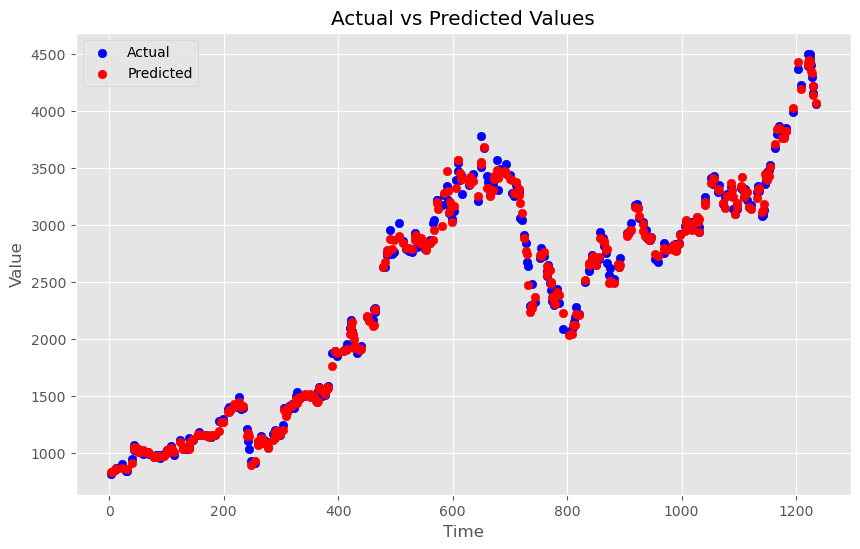

In [69]:
plt.figure(figsize=(10, 6))
plt.scatter(X_test.index, y_test, color='blue', label='Actual')
plt.scatter(X_test.index, y_pred_test_xgb , color='red', label='Predicted')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

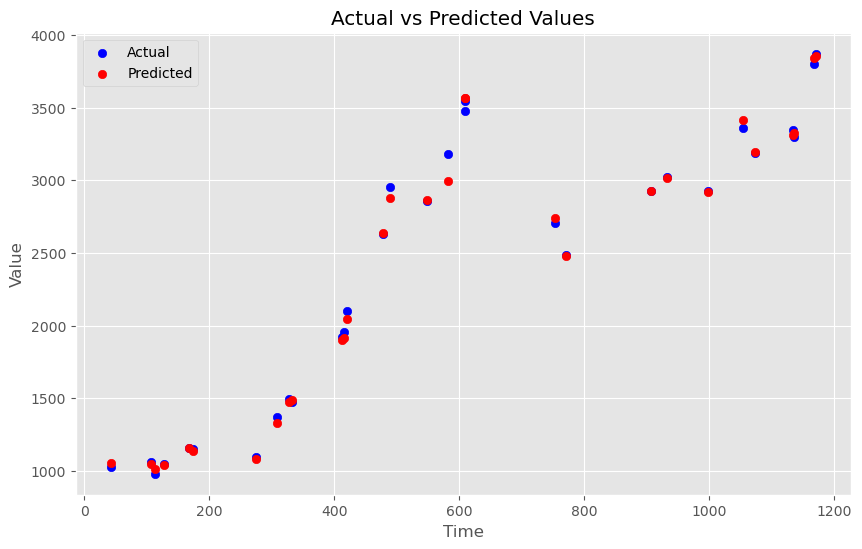

In [70]:
# Let's ZoomIn
plt.figure(figsize=(10, 6))
plt.scatter(X_test.index[:30], y_test[:30], color='blue', label='Actual')
plt.scatter(X_test.index[:30], y_pred_test_xgb[:30] , color='red', label='Predicted')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()


<Figure size 1000x600 with 0 Axes>

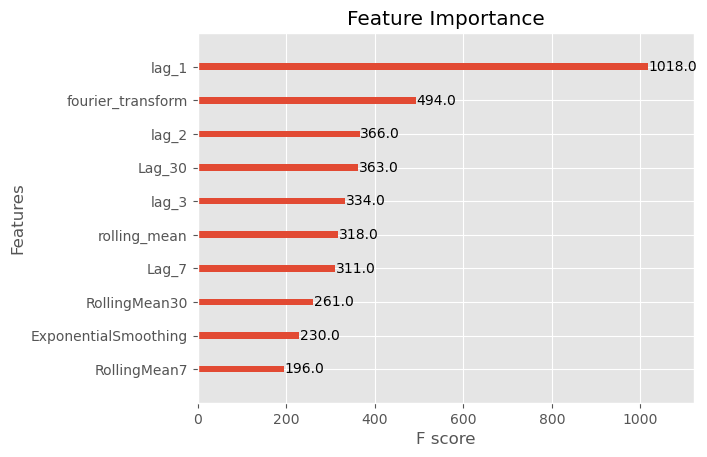

In [71]:
from xgboost import plot_importance

# Plot feature importance
plt.figure(figsize=(10, 6))
plot_importance(xgb_best, max_num_features=20)  # Adjust max_num_features as needed
plt.title("Feature Importance")
plt.show()

# Prophet ---

In [12]:
df

,Date,Month,Year,Quarter,Open,High,Low,Close,Adj_Close,Volume
0,2019-03-19,3,2019,1,844.000000,847.000000,826.549988,837.000000,811.172058,39378.0
1,2019-03-20,3,2019,1,830.500000,851.000000,830.049988,837.750000,811.898926,25939.0
2,2019-03-22,3,2019,1,849.950012,849.950012,831.049988,843.049988,817.035278,11156.0
3,2019-03-25,3,2019,1,827.000000,838.950012,812.200012,820.000000,794.696655,21401.0
4,2019-03-26,3,2019,1,819.250000,827.900024,807.599976,820.250000,794.938904,9780.0
...,...,...,...,...,...,...,...,...,...,...
1229,2024-11-03,11,2024,4,4262.600098,4262.600098,4200.000000,4219.950195,4219.950195,120001.0
1230,2024-12-03,12,2024,4,4275.000000,4309.500000,4151.600098,4161.950195,4161.950195,229393.0
1231,2024-03-13,3,2024,1,4171.950195,4198.649902,4051.050049,4086.199951,4086.199951,258244.0
1232,2024-03-14,3,2024,1,4090.000000,4109.950195,4041.300049,4090.699951,4090.699951,110644.0


In [13]:
df_prophet = df.copy()

In [14]:
from datetime import date

# Set the start date
START = "2019-03-19"

# Get today's date
TODAY = date.today().strftime("%Y-%m-%d")

In [15]:
# Define the specific variables you want to retain
variables_to_keep = ['Date', 'Adj_Close']

# Assuming df contains your dataset
df_prophet = df.copy()

# Retain only the specific variables
df_retained = df_prophet[variables_to_keep]


In [16]:
# Initialize Prophet model with seasonality
model = Prophet(seasonality_mode='additive')

cmd: where.exe tbb.dll
cwd: None
Adding TBB (E:\Anaconda\lib\site-packages\prophet\stan_model\cmdstan-2.33.1\stan\lib\stan_math\lib\tbb) to PATH


In [17]:
split_date = df_prophet.index[int(len(df_prophet) * 0.7)]
train_prophet = df_prophet.loc[df_prophet.index <= split_date].copy()
test_prophet = df_prophet.loc[df_prophet.index > split_date].copy()

In [18]:
# Pre-processing the data for Prophet Algorithm ---

In [19]:
# Split the dataset into training and testing sets
split_date = int(len(df_prophet) * 0.7)
train = df_prophet.iloc[:split_date].copy()
test = df_prophet.iloc[split_date:].copy()

In [20]:
# Format data for Prophet model using 'ds' and 'y'
train_prophet = train.rename(columns={'Date': 'ds', 'Adj_Close': 'y'})

In [21]:
# Fit the Prophet model on the training data
model.fit(train_prophet)

Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
input tempfile: C:\Users\lenovo\AppData\Local\Temp\tmpijfo1yqx\lul1b7wd.json
input tempfile: C:\Users\lenovo\AppData\Local\Temp\tmpijfo1yqx\yhml_sku.json
idx 0
running CmdStan, num_threads: None
CmdStan args: ['E:\\Anaconda\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=90090', 'data', 'file=C:\\Users\\lenovo\\AppData\\Local\\Temp\\tmpijfo1yqx\\lul1b7wd.json', 'init=C:\\Users\\lenovo\\AppData\\Local\\Temp\\tmpijfo1yqx\\yhml_sku.json', 'output', 'file=C:\\Users\\lenovo\\AppData\\Local\\Temp\\tmpijfo1yqx\\prophet_modelrtla0k2k\\prophet_model-20240321111631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:16:31 - cmdstanpy - INFO - Chain [1] start processing
Chain [1] start processing
11:16:32 - cmdstanpy - INFO - Chain [1] done processing
Chain [1] done processing


In [22]:
# Create future dates for prediction
future_dates = model.make_future_dataframe(periods=90, freq='d')

In [24]:
# Make predictions
forecast = model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2019-01-04,1015.275709,683.108428,1419.789083
1,2019-01-07,1023.167296,608.473283,1369.757915
2,2019-01-08,1032.901646,642.544925,1398.754910
3,2019-01-10,1029.050213,611.430943,1391.190793
4,2019-01-11,1044.151339,634.782357,1403.176457


In [25]:
# Assuming you have defined 'test' DataFrame
test_prophet = test.reset_index().rename(columns={'Date':'ds', 'Close':'y'})


# Predict on training set with model
test_data = model.predict(df= test_prophet.reset_index() \
                                   .rename(columns={'Datetime':'ds'}))

In [26]:
test_prophet.head()

,index,ds,Month,Year,Quarter,Open,High,Low,y,Adj_Close,Volume
0,863,2022-09-15,9,2022,3,2884.0,2934.550049,2872.300049,2914.199951,2900.851074,172105.0
1,864,2022-09-16,9,2022,3,2905.0,2949.000000,2800.000000,2833.350098,2820.371582,216580.0
2,865,2022-09-19,9,2022,3,2840.0,2910.000000,2757.149902,2817.800049,2804.892822,134777.0
3,866,2022-09-20,9,2022,3,2830.0,2944.000000,2814.000000,2909.500000,2896.172607,270644.0
4,867,2022-09-21,9,2022,3,2909.0,2935.300049,2747.949951,2769.250000,2756.565186,251983.0


In [28]:
# Format data for prophet model using ds and y
test_prophet = test.reset_index().rename(columns={'Date': 'ds', 'Close': 'y'})

# Predict using the Prophet model
test_predict = model.predict(test_prophet)

# Display the predictions
test_predict

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-01-11,2928.334512,2745.785567,3495.542435,2928.334512,2928.334512,198.306925,198.306925,198.306925,-13.418722,-13.418722,-13.418722,211.725647,211.725647,211.725647,0.0,0.0,0.0,3126.641437
1,2022-01-12,2926.631229,2758.921565,3498.062020,2926.631229,2926.631229,205.980950,205.980950,205.980950,-3.290639,-3.290639,-3.290639,209.271589,209.271589,209.271589,0.0,0.0,0.0,3132.612179
2,2022-02-11,2875.532760,2724.220070,3458.553922,2875.532760,2875.532760,209.080421,209.080421,209.080421,-5.985362,-5.985362,-5.985362,215.065783,215.065783,215.065783,0.0,0.0,0.0,3084.613181
3,2022-02-12,2873.829478,2731.578523,3528.105109,2873.829478,2873.829478,257.533840,257.533840,257.533840,37.450138,37.450138,37.450138,220.083703,220.083703,220.083703,0.0,0.0,0.0,3131.363319
4,2022-03-10,2829.544138,2492.644142,3239.214568,2829.544138,2829.544138,35.815211,35.815211,35.815211,-21.143193,-21.143193,-21.143193,56.958404,56.958404,56.958404,0.0,0.0,0.0,2865.359349
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366,2024-11-01,1182.470156,-59.093100,2435.302802,50.021152,2343.778254,-9.128822,-9.128822,-9.128822,-5.985362,-5.985362,-5.985362,-3.143460,-3.143460,-3.143460,0.0,0.0,0.0,1173.341334
367,2024-11-03,1179.063591,-79.311000,2466.681944,39.488278,2346.545158,16.359608,16.359608,16.359608,25.469339,25.469339,25.469339,-9.109732,-9.109732,-9.109732,0.0,0.0,0.0,1195.423199
368,2024-12-01,1131.371687,-30.902439,2440.517253,-14.844446,2304.949854,34.445372,34.445372,34.445372,25.469339,25.469339,25.469339,8.976033,8.976033,8.976033,0.0,0.0,0.0,1165.817059
369,2024-12-02,1129.668405,-113.084220,2356.248467,-19.903119,2313.600665,-14.526133,-14.526133,-14.526133,-19.081561,-19.081561,-19.081561,4.555427,4.555427,4.555427,0.0,0.0,0.0,1115.142271


In [29]:
test_predict.head(10)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2022-01-11,2928.334512,2745.785567,3495.542435,2928.334512,2928.334512,198.306925,198.306925,198.306925,-13.418722,-13.418722,-13.418722,211.725647,211.725647,211.725647,0.0,0.0,0.0,3126.641437
1,2022-01-12,2926.631229,2758.921565,3498.062020,2926.631229,2926.631229,205.980950,205.980950,205.980950,-3.290639,-3.290639,-3.290639,209.271589,209.271589,209.271589,0.0,0.0,0.0,3132.612179
2,2022-02-11,2875.532760,2724.220070,3458.553922,2875.532760,2875.532760,209.080421,209.080421,209.080421,-5.985362,-5.985362,-5.985362,215.065783,215.065783,215.065783,0.0,0.0,0.0,3084.613181
3,2022-02-12,2873.829478,2731.578523,3528.105109,2873.829478,2873.829478,257.533840,257.533840,257.533840,37.450138,37.450138,37.450138,220.083703,220.083703,220.083703,0.0,0.0,0.0,3131.363319
4,2022-03-10,2829.544138,2492.644142,3239.214568,2829.544138,2829.544138,35.815211,35.815211,35.815211,-21.143193,-21.143193,-21.143193,56.958404,56.958404,56.958404,0.0,0.0,0.0,2865.359349
5,2022-03-11,2827.840856,2481.831285,3257.345118,2827.840856,2827.840856,37.085108,37.085108,37.085108,-5.985362,-5.985362,-5.985362,43.070470,43.070470,43.070470,0.0,0.0,0.0,2864.925964
6,2022-04-10,2776.742387,2426.700048,3189.920175,2776.742387,2776.742387,20.246056,20.246056,20.246056,25.469339,25.469339,25.469339,-5.223283,-5.223283,-5.223283,0.0,0.0,0.0,2796.988443
7,2022-04-11,2775.039105,2365.646049,3130.864105,2775.039105,2775.039105,-14.962729,-14.962729,-14.962729,-19.081561,-19.081561,-19.081561,4.118832,4.118832,4.118832,0.0,0.0,0.0,2760.076376
8,2022-05-12,2722.237354,2137.735289,2917.094869,2722.237354,2722.237354,-185.671161,-185.671161,-185.671161,-21.143193,-21.143193,-21.143193,-164.527967,-164.527967,-164.527967,0.0,0.0,0.0,2536.566193
9,2022-06-10,2672.842167,2149.732891,2897.240030,2672.842167,2672.842167,-139.665766,-139.665766,-139.665766,-5.985362,-5.985362,-5.985362,-133.680404,-133.680404,-133.680404,0.0,0.0,0.0,2533.176401


In [30]:
test_predict.tail(15)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
356,2024-05-03,1492.467534,215.217295,2541.527562,420.102846,2592.035543,-120.712090,-120.712090,-120.712090,-5.985362,-5.985362,-5.985362,-114.726728,-114.726728,-114.726728,0.0,0.0,0.0,1371.755444
357,2024-06-02,1441.369065,216.940589,2584.301939,362.814521,2547.115944,-43.380217,-43.380217,-43.380217,25.469339,25.469339,25.469339,-68.849556,-68.849556,-68.849556,0.0,0.0,0.0,1397.988848
358,2024-06-03,1439.665783,177.931718,2508.504750,355.806539,2551.586131,-93.997337,-93.997337,-93.997337,-19.081561,-19.081561,-19.081561,-74.915776,-74.915776,-74.915776,0.0,0.0,0.0,1345.668446
359,2024-07-02,1390.270596,110.341175,2505.748885,301.699868,2508.364413,-110.103559,-110.103559,-110.103559,-13.418722,-13.418722,-13.418722,-96.684837,-96.684837,-96.684837,0.0,0.0,0.0,1280.167037
360,2024-07-03,1388.567314,100.389106,2540.741575,295.285101,2512.834599,-91.540121,-91.540121,-91.540121,-3.290639,-3.290639,-3.290639,-88.249482,-88.249482,-88.249482,0.0,0.0,0.0,1297.027193
361,2024-08-01,1339.172127,14.149251,2445.699295,239.794230,2469.612881,-98.060253,-98.060253,-98.060253,-21.143193,-21.143193,-21.143193,-76.917060,-76.917060,-76.917060,0.0,0.0,0.0,1241.111874
362,2024-08-02,1337.468845,21.070220,2436.728399,231.808869,2474.083068,-78.340422,-78.340422,-78.340422,-5.985362,-5.985362,-5.985362,-72.355060,-72.355060,-72.355060,0.0,0.0,0.0,1259.128423
363,2024-09-01,1286.370376,151.800404,2501.288976,175.843977,2429.158068,16.970656,16.970656,16.970656,25.469339,25.469339,25.469339,-8.498684,-8.498684,-8.498684,0.0,0.0,0.0,1303.341032
364,2024-09-02,1284.667094,29.480735,2476.921533,166.743311,2433.628254,-26.841716,-26.841716,-26.841716,-19.081561,-19.081561,-19.081561,-7.760155,-7.760155,-7.760155,0.0,0.0,0.0,1257.825378
365,2024-10-01,1235.271907,-21.055922,2419.818393,109.950741,2390.406536,-52.928956,-52.928956,-52.928956,-13.418722,-13.418722,-13.418722,-39.510233,-39.510233,-39.510233,0.0,0.0,0.0,1182.342952


In [31]:
# Generate future dates for the next 90 days
future_dates = model.make_future_dataframe(periods=90)

# Predict on the future dates
forecast = model.predict(future_dates)

# Select relevant columns for predictions
predictions = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

# Set the index to dates
predictions.set_index('ds', inplace=True)

# Print the predictions
print(predictions.tail(90))


                   yhat   yhat_lower   yhat_upper
ds                                               
2022-12-10  2368.828866  1971.290689  2754.089578
2022-12-11  2352.665937  1987.669865  2723.433908
2022-12-12  2304.939970  1926.653873  2679.196861
2022-12-13  2308.565397  1941.273244  2703.159488
2022-12-14  2317.903025  1912.236264  2724.077170
...                 ...          ...          ...
2023-03-05  2369.028536  2015.229043  2785.396300
2023-03-06  2310.032255  1897.855424  2693.654855
2023-03-07  2300.870360  1936.294453  2705.041763
2023-03-08  2295.865766  1908.890419  2704.132293
2023-03-09  2262.647851  1879.445165  2657.847673

[90 rows x 3 columns]


In [32]:
from sklearn.metrics import mean_absolute_percentage_error

prophet_loss = mean_absolute_percentage_error(test['Close'], test_predict['yhat'])
print(f"ERROR PERCENT = {prophet_loss}%")

ERROR PERCENT = 0.3467364768355371%


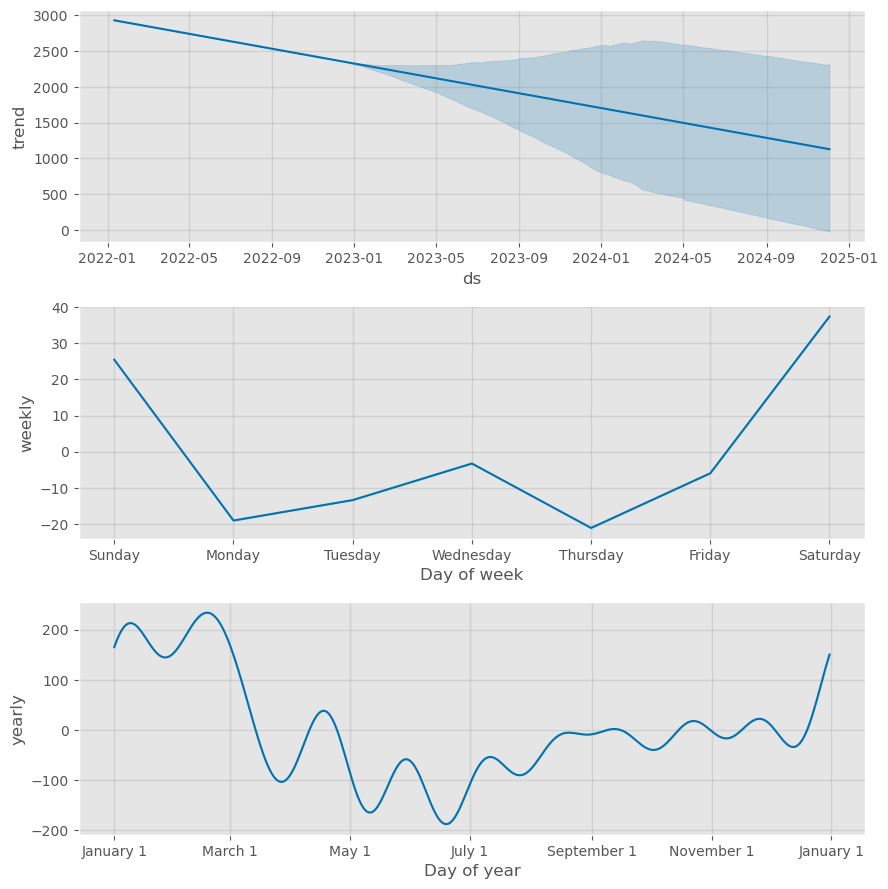

In [33]:
# Plot components using predictions
fig = model.plot_components(test_predict)

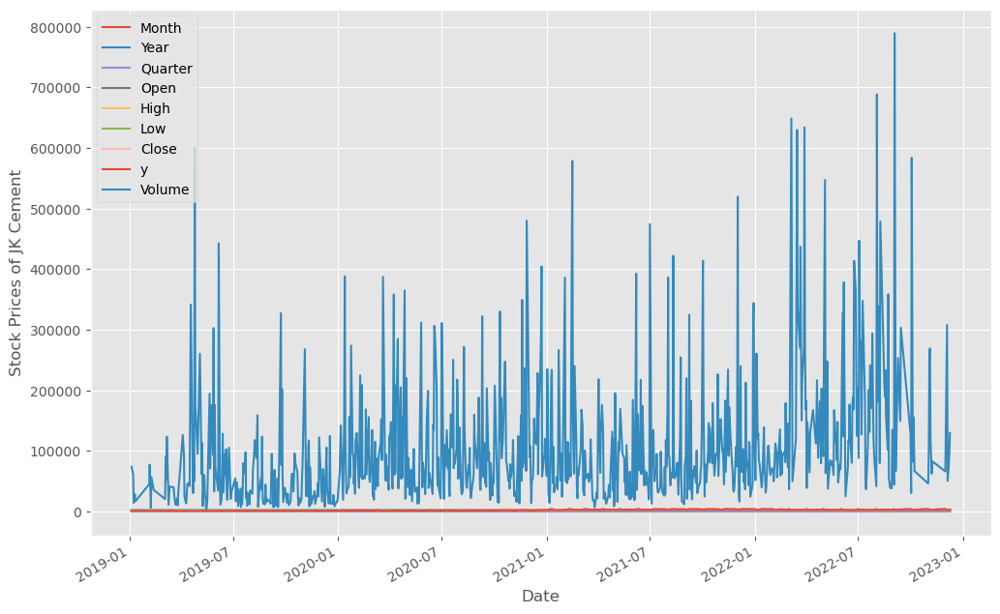

In [34]:
ax = train_prophet.set_index('ds').plot(figsize=(12, 8))
ax.set_ylabel('Stock Prices of JK Cement')
ax.set_xlabel('Date')

plt.show()

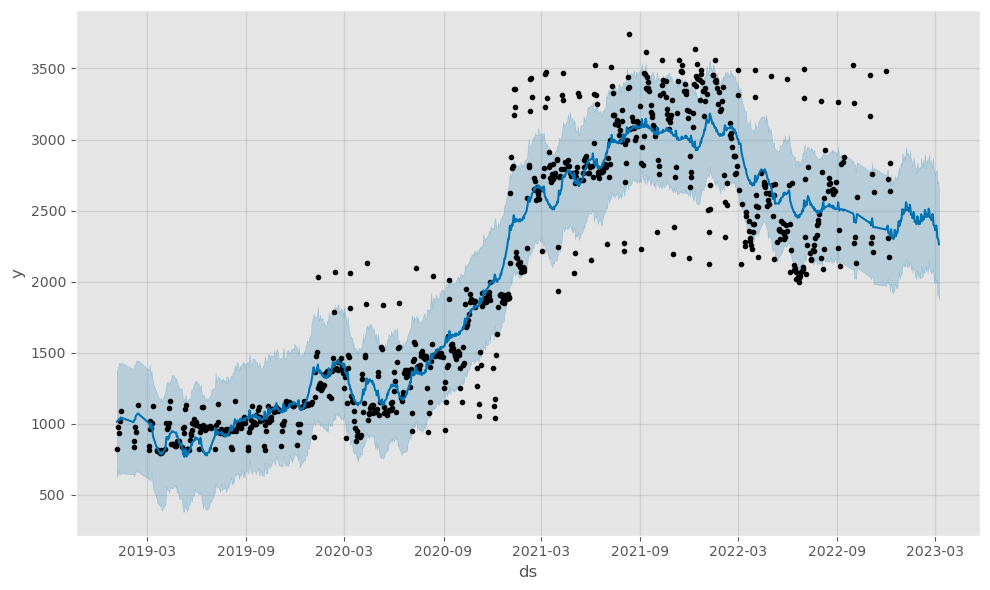

In [35]:
# Plot the forecast
fig = model.plot(forecast, uncertainty=True)

# Forecasted components ---

In [ ]:
# Plotting the forecasted components ---

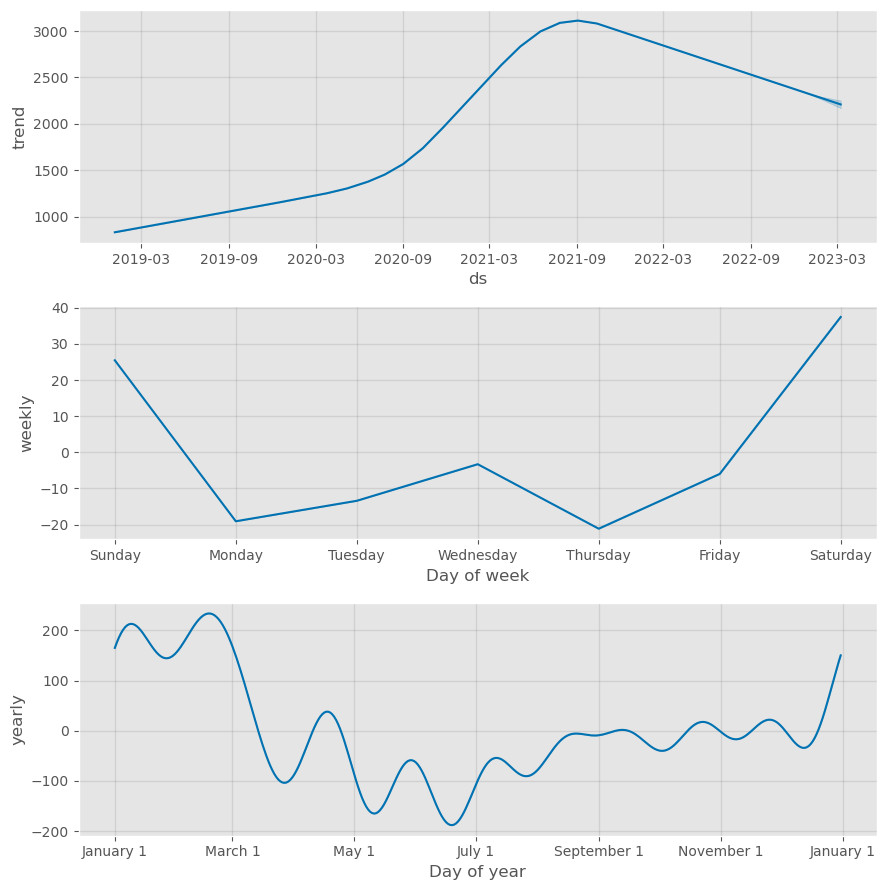

In [36]:
fig1 = model.plot_components(forecast)

In [ ]:
# Adding Changepoints to Prophet ---

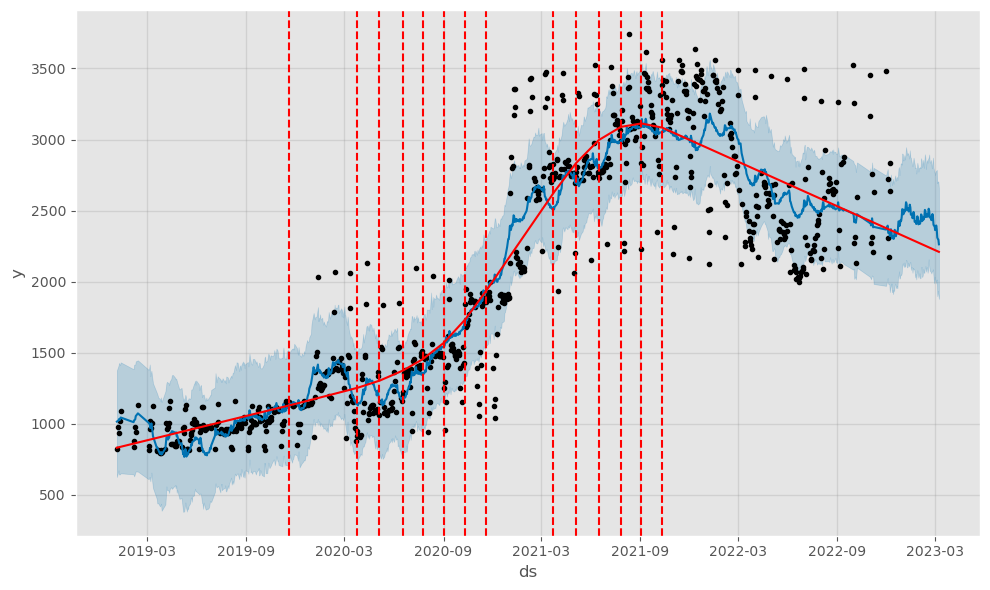

In [37]:
from prophet.plot import add_changepoints_to_plot

# Plot the forecast
fig = model.plot(forecast)

# Add changepoints to the plot
fig = add_changepoints_to_plot(fig.gca(), model, forecast)


In [38]:
model.changepoints

28    2019-04-10
55    2019-05-24
83    2019-07-11
110   2019-08-26
138   2019-10-10
165   2019-11-20
193   2020-01-07
220   2020-02-14
248   2020-03-25
276   2020-05-05
303   2020-06-17
331   2020-07-24
358   2020-09-01
386   2020-10-11
413   2020-11-18
441   2021-01-01
469   2021-02-11
496   2021-03-24
524   2021-05-04
551   2021-06-16
579   2021-07-27
606   2021-09-03
634   2021-10-12
661   2021-11-25
689   2022-01-02
Name: ds, dtype: datetime64[ns]

# ARIMA (AutoRegressive Integrated Moving Average)

In [77]:
df_arima = df.copy()
df_arima

,Date,Month,Year,Quarter,Open,High,Low,Close,Adj_Close,Volume
0,2019-03-19,3,2019,1,844.000000,847.000000,826.549988,837.000000,811.172058,39378.0
1,2019-03-20,3,2019,1,830.500000,851.000000,830.049988,837.750000,811.898926,25939.0
2,2019-03-22,3,2019,1,849.950012,849.950012,831.049988,843.049988,817.035278,11156.0
3,2019-03-25,3,2019,1,827.000000,838.950012,812.200012,820.000000,794.696655,21401.0
4,2019-03-26,3,2019,1,819.250000,827.900024,807.599976,820.250000,794.938904,9780.0
...,...,...,...,...,...,...,...,...,...,...
1229,2024-11-03,11,2024,4,4262.600098,4262.600098,4200.000000,4219.950195,4219.950195,120001.0
1230,2024-12-03,12,2024,4,4275.000000,4309.500000,4151.600098,4161.950195,4161.950195,229393.0
1231,2024-03-13,3,2024,1,4171.950195,4198.649902,4051.050049,4086.199951,4086.199951,258244.0
1232,2024-03-14,3,2024,1,4090.000000,4109.950195,4041.300049,4090.699951,4090.699951,110644.0


In [101]:
split_date = df_arima.index[int(len(df_arima) * 0.7)]
train_arima = df_arima.loc[df_arima.index <= split_date].copy()
test_arima = df_arima.loc[df_arima.index > split_date].copy()

In [102]:
# Try to find the best parameters for arima model 
stepwise_fit = auto_arima(train_arima['Close'],trace=True,suppress_warnings=True)
# assign the parameter to "best_order" variable
best_order = stepwise_fit.get_params()['order']

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=2.99 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=9326.000, Time=0.06 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=9325.608, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=9325.542, Time=0.37 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=9326.130, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=9327.257, Time=0.91 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=9327.381, Time=0.52 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=9329.268, Time=0.94 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=9325.457, Time=0.16 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=9327.216, Time=0.39 sec
 ARIMA(0,1,2)(0,0,0)[0]             : AIC=9327.341, Time=0.28 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=9325.518, Time=0.07 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=9329.215, Time=0.53 sec

Best model:  ARIMA(0,1,1)(0,0,0)[0]          
Total fit time: 7.382 seconds


In [103]:
from statsmodels.tsa.arima.model import ARIMA

# Define and fit the ARIMA model
arima = ARIMA(train_arima['Adj_Close'], order=best_order)
arima_fit = arima.fit()

In [104]:
arima_fit

In [83]:
# Dropping remaining variables and keeping only 'Date' and 'Adj_Close'
df = df[['Date', 'Adj_Close']]

# Set 'Date' as the index
df_arima.set_index('Date', inplace=True)

<AxesSubplot:xlabel='Date'>

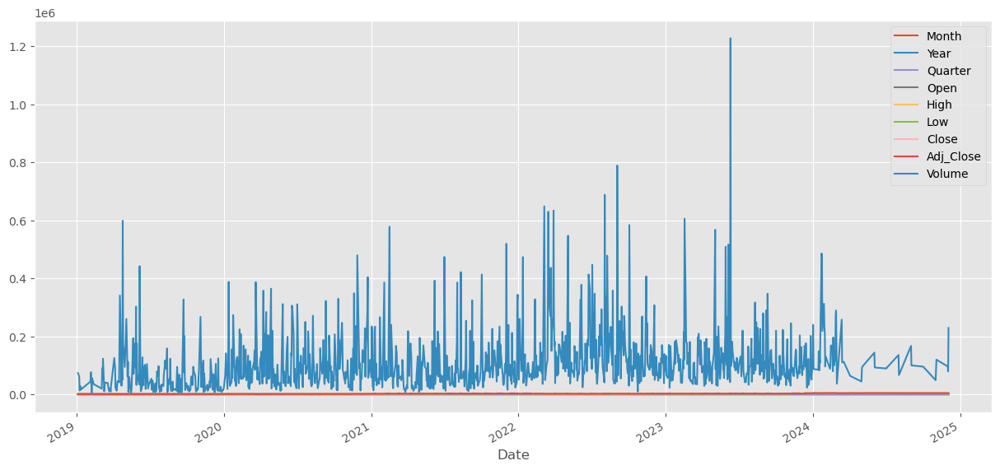

In [84]:
# Updating the header

from pylab import rcParams
rcParams['figure.figsize'] = 15, 7
df_arima.plot()

In [85]:
from statsmodels.tsa.stattools import adfuller
test_result=adfuller(df['Adj_Close'])

In [87]:
from statsmodels.tsa.stattools import adfuller

def adfuller_test(Adj_Close):
    result = adfuller(Adj_Close)
    labels = ['ADF Test Statistic', 'p-value', '#Lags Used', 'Number of Observations']
    for value, label in zip(result, labels):
        print(label + ' : ' + str(value) )

    if result[1] <= 0.05:
        print("Strong evidence against the null hypothesis (Ho), reject the null hypothesis. Data is stationary.")
    else:
        print("Weak evidence against null hypothesis, indicating it is non-stationary.")

adfuller_test(df['Adj_Close'])

ADF Test Statistic : -0.6731653573948748
p-value : 0.8535784240084043
#Lags Used : 12
Number of Observations : 1221
Weak evidence against null hypothesis, indicating it is non-stationary.


In [88]:
# Frst difference & seasonal difference---

df['Adj_Close First Difference'] = df['Adj_Close'] - df['Adj_Close'].shift(1)
df['Seasonal First Difference']=df['Adj_Close']-df['Adj_Close'].shift(12)
df.head()

,Date,Adj_Close,Adj_Close First Difference,Seasonal First Difference
0,2019-03-19,811.172058,NaN,NaN
1,2019-03-20,811.898926,0.726868,NaN
2,2019-03-22,817.035278,5.136352,NaN
3,2019-03-25,794.696655,-22.338623,NaN
4,2019-03-26,794.938904,0.242249,NaN


In [89]:
# Again testing if data is stationary
adfuller_test(df['Seasonal First Difference'].dropna())

ADF Test Statistic : -6.920714471679902
p-value : 1.1484017970990303e-09
#Lags Used : 22
Number of Observations : 1199
Strong evidence against the null hypothesis (Ho), reject the null hypothesis. Data is stationary.


### As p-value > 0.05, the data is stationary.

<AxesSubplot:>

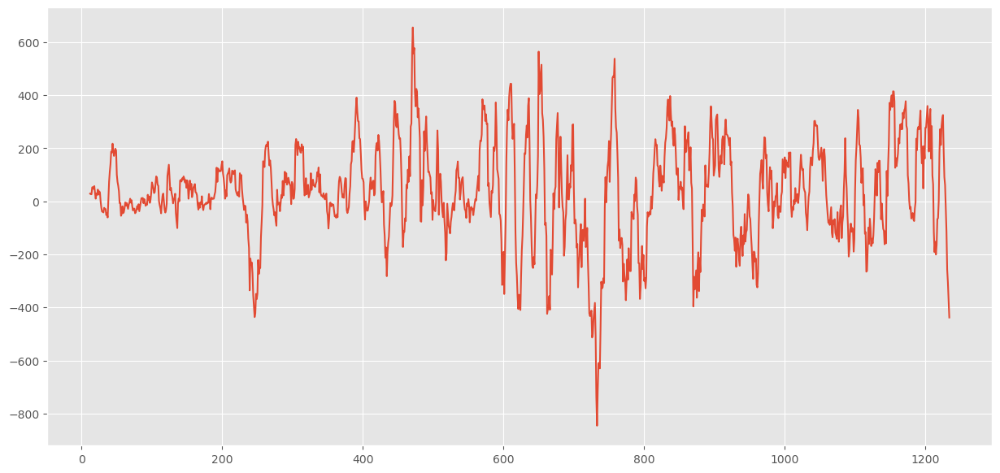

In [90]:
df['Seasonal First Difference'].plot()

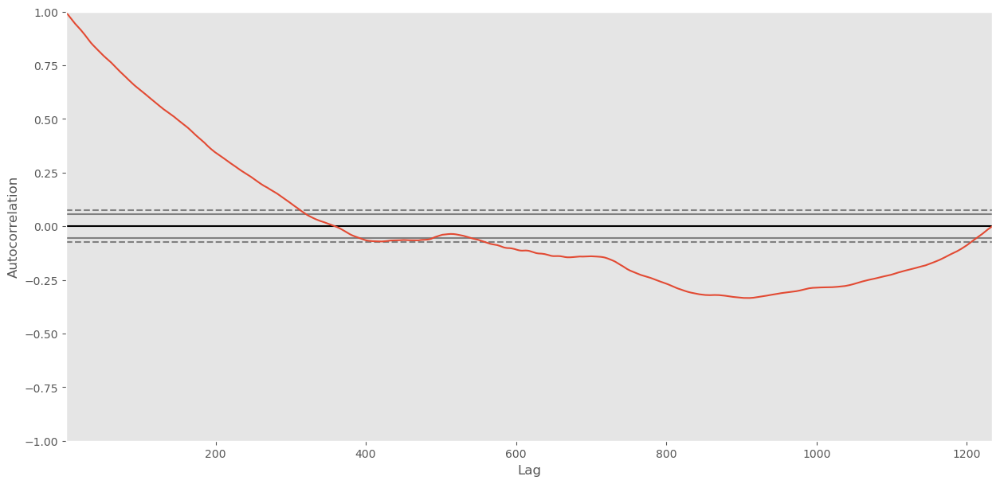

In [91]:
# Creating Auto-correlation ---

from pandas.plotting import autocorrelation_plot
autocorrelation_plot(df['Adj_Close'])
plt.show()

# ACF & PACF Plots

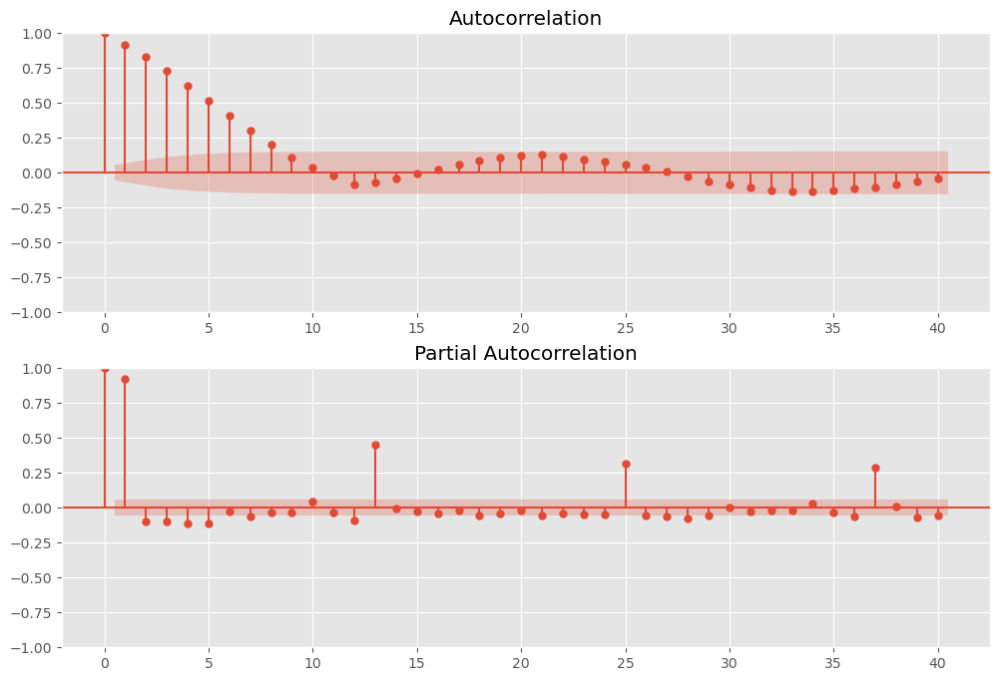

In [72]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df['Seasonal First Difference'].dropna(),lags=40,ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df['Seasonal First Difference'].dropna(),lags=40,ax=ax2)

In [92]:
from statsmodels.tsa.arima.model import ARIMA

# For non-seasonal data, with p=1, d=1, q=1
model = ARIMA(df['Adj_Close'], order=(1, 1, 1))
model_fit = model.fit()

# Display model summary
print(model_fit.summary())

# For non-seasonal data
#p=1, d=1, q=0 or 1

                               SARIMAX Results                                
Dep. Variable:              Adj_Close   No. Observations:                 1234
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -6566.332
Date:                Thu, 21 Mar 2024   AIC                          13138.665
Time:                        17:03:16   BIC                          13154.016
Sample:                             0   HQIC                         13144.440
                               - 1234                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5952      0.214      2.787      0.005       0.177       1.014
ma.L1         -0.5325      0.224     -2.375      0.018      -0.972      -0.093
sigma2      2472.7297     58.565     42.222      0.0

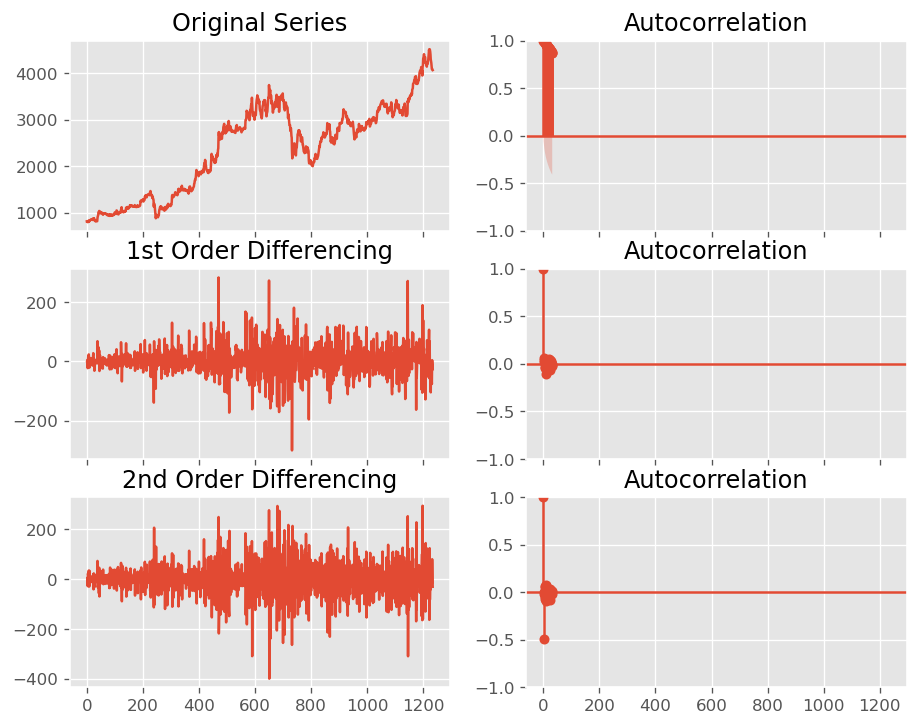

In [93]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

# Original Series
fig, axes = plt.subplots(3, 2, sharex=True)
axes[0, 0].plot(df['Adj_Close']); axes[0, 0].set_title('Original Series')
plot_acf(df['Adj_Close'], ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df['Adj_Close'].diff()); axes[1, 0].set_title('1st Order Differencing')
plot_acf(df['Adj_Close'].diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df['Adj_Close'].diff().diff()); axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df['Adj_Close'].diff().diff().dropna(), ax=axes[2, 1])

plt.show()

In [ ]:
# To find the order of the AR term (p) --- 

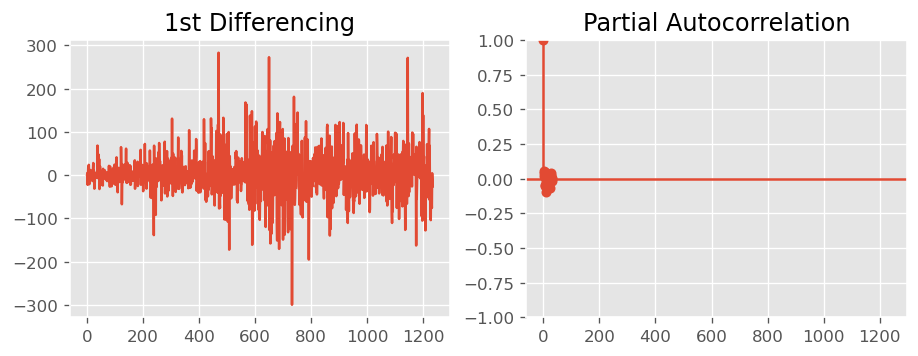

In [115]:
# PACF plot of 1st differenced series
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

fig, axes = plt.subplots(1, 2, sharex=True)
axes[0].plot(df['Adj_Close'].diff()); axes[0].set_title('1st Differencing')
axes[1].set(ylim=(0,5))
plot_pacf(df['Adj_Close'].diff().dropna(), ax=axes[1])

plt.show()

In [ ]:
# To find the order of to find the order of the MA term (q) ---

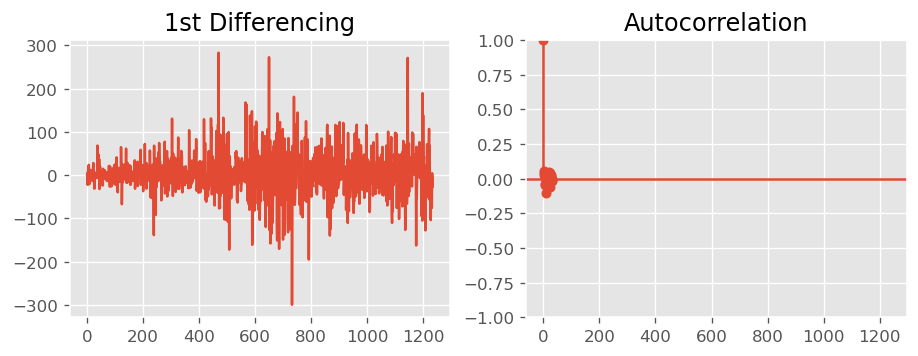

In [116]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plt.rcParams.update({'figure.figsize':(9,3), 'figure.dpi':120})

fig, axes = plt.subplots(1, 2, sharex=True)
axes[0].plot(df['Adj_Close'].diff()); axes[0].set_title('1st Differencing')
axes[1].set(ylim=(0,1.2))
plot_acf(df['Adj_Close'].diff().dropna(), ax=axes[1])

plt.show()

In [ ]:
# How to build ARIMA model ---

In [95]:
from statsmodels.tsa.arima.model import ARIMA

# 1,1,2 ARIMA Model
model = ARIMA(df['Adj_Close'], order=(1, 1, 2))
model_fit = model.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:              Adj_Close   No. Observations:                 1234
Model:                 ARIMA(1, 1, 2)   Log Likelihood               -6566.198
Date:                Thu, 21 Mar 2024   AIC                          13140.397
Time:                        17:06:53   BIC                          13160.865
Sample:                             0   HQIC                         13148.097
                               - 1234                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5374      0.335      1.604      0.109      -0.119       1.194
ma.L1         -0.4815      0.336     -1.431      0.152      -1.141       0.178
ma.L2          0.0177      0.037      0.484      0.6

In [96]:
from statsmodels.tsa.arima.model import ARIMA

# 1,1,1 ARIMA Model
model = ARIMA(df['Adj_Close'], order=(1, 1, 1))
model_fit = model.fit()
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:              Adj_Close   No. Observations:                 1234
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -6566.332
Date:                Thu, 21 Mar 2024   AIC                          13138.665
Time:                        17:06:58   BIC                          13154.016
Sample:                             0   HQIC                         13144.440
                               - 1234                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5952      0.214      2.787      0.005       0.177       1.014
ma.L1         -0.5325      0.224     -2.375      0.018      -0.972      -0.093
sigma2      2472.7297     58.565     42.222      0.0

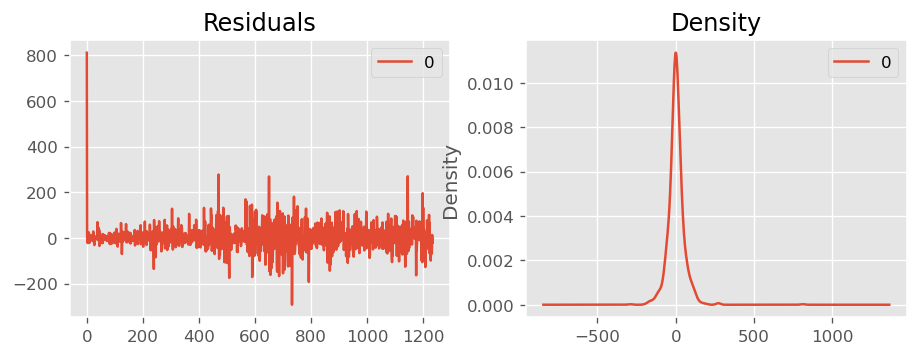

In [119]:
# Plot residual errors
residuals = pd.DataFrame(model_fit.resid)
fig, ax = plt.subplots(1,2)
residuals.plot(title="Residuals", ax=ax[0])
residuals.plot(kind='kde', title='Density', ax=ax[1])
plt.show()

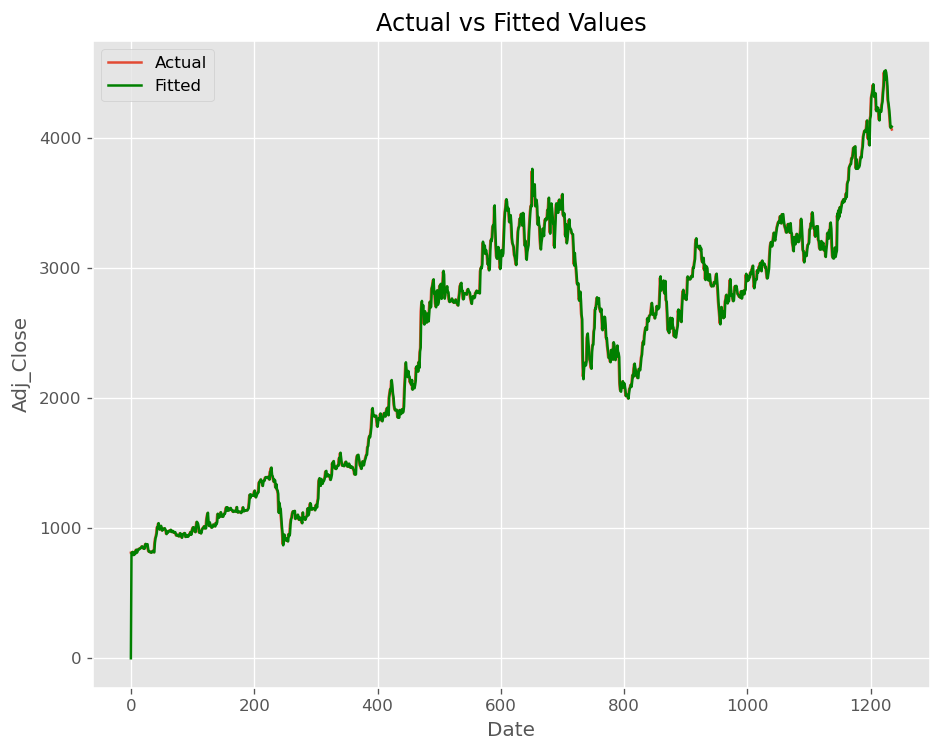

In [97]:
# Get the fitted values from the model
fitted_values = model_fit.fittedvalues

# Plot actual vs fitted values
plt.plot(df.index, df['Adj_Close'], label='Actual')
plt.plot(df.index, fitted_values, color='green', label='Fitted')
plt.xlabel('Date')
plt.ylabel('Adj_Close')
plt.title('Actual vs Fitted Values')
plt.legend()
plt.show()


# Auto Arima ---

In [109]:
from statsmodels.tsa.arima.model import ARIMA  # Import ARIMA from the new location

import pmdarima as pm

# Using pmdarima to automatically select the best ARIMA model
model = pm.auto_arima(df['Adj_Close'], start_p=1, start_q=1,
                      test='adf',       # Use adftest to find optimal 'd'
                      max_p=3, max_q=3, # Maximum p and q
                      m=1,              # Frequency of series
                      d=None,           # Let model determine 'd'
                      seasonal=False,   # No Seasonality
                      start_P=0, 
                      D=0, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True)

# Print the summary of the best model
print(model.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=13138.045, Time=0.87 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=13140.697, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=13138.596, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=13138.907, Time=0.25 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=13142.153, Time=0.09 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=13139.811, Time=1.76 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=13139.794, Time=1.87 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=13139.124, Time=0.70 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=13138.725, Time=0.19 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=13139.239, Time=2.79 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=13138.665, Time=0.42 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 9.217 seconds
                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:       

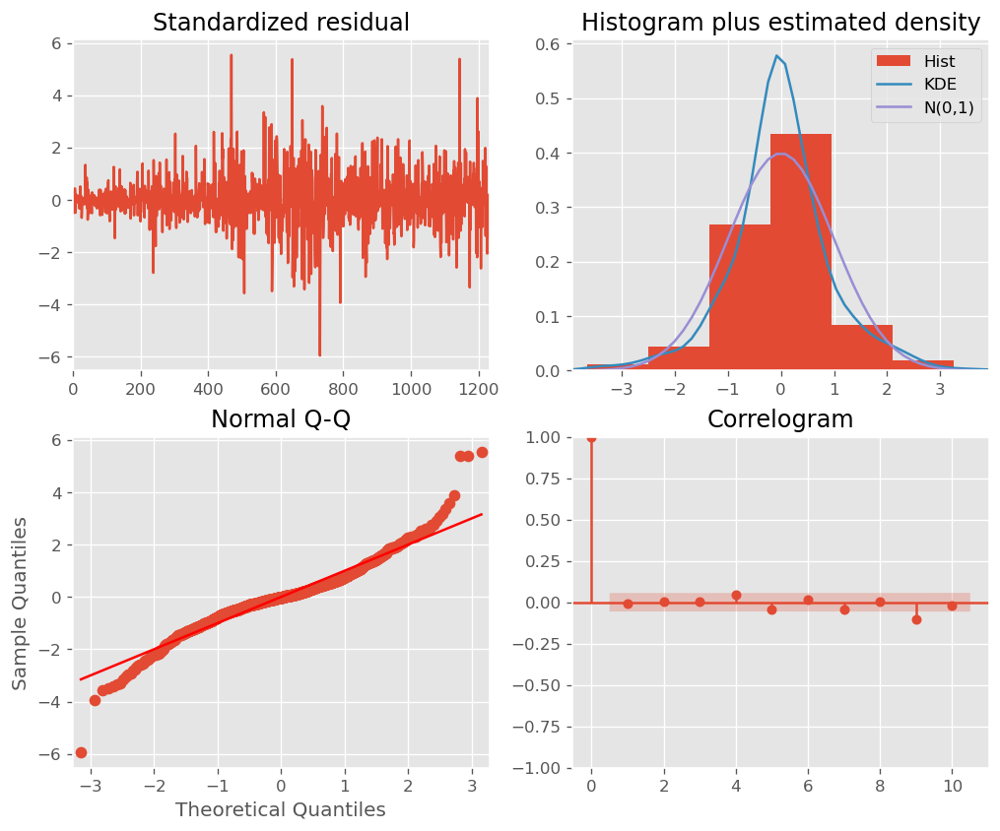

In [110]:
# Residual Plots ---

model.plot_diagnostics(figsize=(10,8))
plt.show()

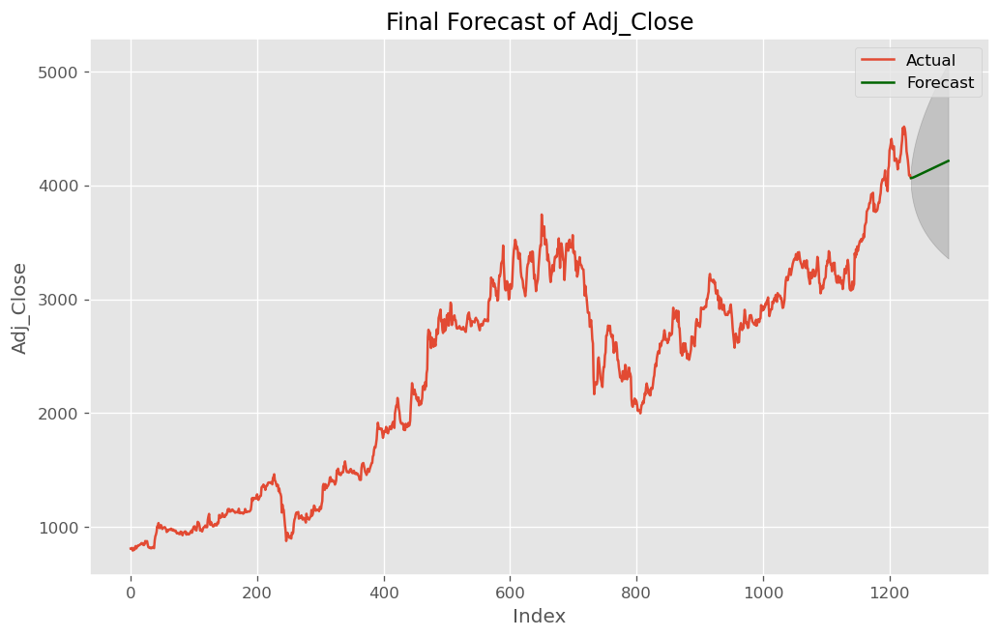

In [111]:
# Forecast
n_periods = 60  # Number of periods to forecast

plt.figure(figsize=(10, 6))  # Adjust the values as needed (width, height)
fc, confint = model.predict(n_periods=n_periods, return_conf_int=True)  # Get forecast and confidence intervals
index_of_fc = np.arange(len(df.Adj_Close), len(df.Adj_Close) + n_periods)  # Create index for forecasted values

# Make series for plotting purpose
fc_series = pd.Series(fc, index=index_of_fc)  # Forecasted values series
lower_series = pd.Series(confint[:, 0], index=index_of_fc)  # Lower bound of confidence interval series
upper_series = pd.Series(confint[:, 1], index=index_of_fc)  # Upper bound of confidence interval series

# Plot
plt.plot(df.Adj_Close, label='Actual')  # Plot actual values
plt.plot(fc_series, color='darkgreen', label='Forecast')  # Plot forecasted values
plt.fill_between(lower_series.index, lower_series, upper_series, color='k', alpha=.15)  # Fill confidence interval
plt.title("Final Forecast of Adj_Close")  # Set title
plt.xlabel("Index")  # Set x-axis label
plt.ylabel("Adj_Close")  # Set y-axis label
plt.legend()  # Show legend
plt.show()  # Display plot


In [112]:
train_size = int(len(df['Adj_Close']) * 0.7)  # 80% of data for training
train_data = df['Adj_Close'][:train_size]
test_data = df['Adj_Close'][train_size:]

In [113]:
model.fit(train_data)

ARIMA(order=(1, 1, 1), scoring_args={}, suppress_warnings=True)

In [114]:
forecast = model.predict(len(test_data))  # Forecast using the model
forecast.head (10)

863    2878.568493
864    2880.439671
865    2882.747815
866    2884.985824
867    2887.235091
868    2889.482550
869    2891.730299
870    2893.978002
871    2896.225712
872    2898.473421
dtype: float64

In [115]:
forecast.tail(10)

1224    3689.667079
1225    3691.914789
1226    3694.162498
1227    3696.410207
1228    3698.657916
1229    3700.905626
1230    3703.153335
1231    3705.401044
1232    3707.648753
1233    3709.896463
dtype: float64

In [116]:
# Calculate the total sum of squares (TSS)
tss = np.sum((test_data - np.mean(test_data))**2)

# Calculate the residual sum of squares (RSS)
rss = np.sum((test_data - forecast)**2)

# Calculate R-squared (R2)
r_squared = 1 - (rss / tss)
print("R-squared (R2):", r_squared)

R-squared (R2): 0.6043049036878851


In [117]:
# Assuming 'test_data' contains the actual values and 'forecast' contains the predicted values
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test_data, forecast))
print("Root Mean Squared Error (RMSE):", rmse)

# Calculate Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((test_data - forecast) / test_data)) * 100
print("Mean Absolute Percentage Error (MAPE):", mape)

Root Mean Squared Error (RMSE): 308.0428685431694
Mean Absolute Percentage Error (MAPE): 7.811356098675666


# SARIMA

In [128]:
df

,Date,Month,Year,Quarter,Open,High,Low,Close,Adj_Close,Volume
0,2019-03-19,3,2019,1,844.000000,847.000000,826.549988,837.000000,811.172058,39378.0
1,2019-03-20,3,2019,1,830.500000,851.000000,830.049988,837.750000,811.898926,25939.0
2,2019-03-22,3,2019,1,849.950012,849.950012,831.049988,843.049988,817.035278,11156.0
3,2019-03-25,3,2019,1,827.000000,838.950012,812.200012,820.000000,794.696655,21401.0
4,2019-03-26,3,2019,1,819.250000,827.900024,807.599976,820.250000,794.938904,9780.0
...,...,...,...,...,...,...,...,...,...,...
1229,2024-11-03,11,2024,4,4262.600098,4262.600098,4200.000000,4219.950195,4219.950195,120001.0
1230,2024-12-03,12,2024,4,4275.000000,4309.500000,4151.600098,4161.950195,4161.950195,229393.0
1231,2024-03-13,3,2024,1,4171.950195,4198.649902,4051.050049,4086.199951,4086.199951,258244.0
1232,2024-03-14,3,2024,1,4090.000000,4109.950195,4041.300049,4090.699951,4090.699951,110644.0


In [129]:
df.set_index('Date', inplace=True)

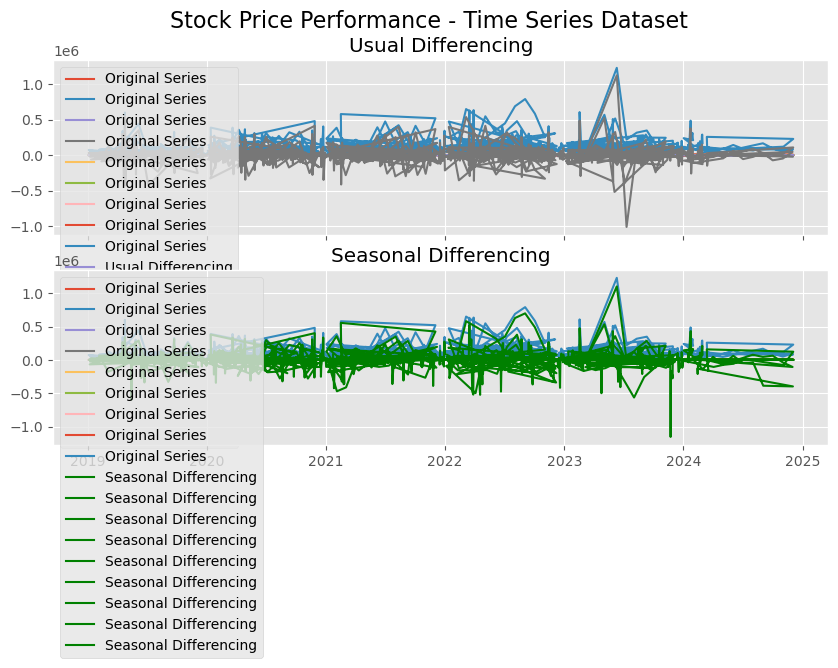

In [130]:
# Plot
fig, axes = plt.subplots(2, 1, figsize=(10,5), dpi=100, sharex=True)

# Usual Differencing
axes[0].plot(df[:], label='Original Series')
axes[0].plot(df[:].diff(1), label='Usual Differencing')
axes[0].set_title('Usual Differencing')
axes[0].legend(loc='upper left', fontsize=10)


# Seasonal Differencing
axes[1].plot(df[:], label='Original Series')
axes[1].plot(df[:].diff(12), label='Seasonal Differencing', color='green')
axes[1].set_title('Seasonal Differencing')
plt.legend(loc='upper left', fontsize=10)
plt.suptitle('Stock Price Performance - Time Series Dataset', fontsize=16)
plt.show()


In [131]:
import pandas as pd
import pmdarima as pm

# Assuming 'df' is your DataFrame and 'column_name' is the column you want to use for modeling
data = df['Adj_Close']

# Perform Seasonal - fit stepwise auto-ARIMA
smodel = pm.auto_arima(data, start_p=1, start_q=1,
                       test='adf',
                       max_p=3, max_q=3, m=12,  # Adjust 'm' for the frequency of your data
                       start_P=0, seasonal=True,
                       d=None, D=1, trace=True,
                       error_action='ignore',  
                       suppress_warnings=True, 
                       stepwise=True)

# Display the summary of the model
smodel.summary()

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=inf, Time=6.28 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=16214.280, Time=0.15 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=13576.322, Time=3.74 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=15089.750, Time=5.87 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=16253.774, Time=0.11 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=13903.322, Time=0.65 sec
 ARIMA(1,0,0)(2,1,0)[12] intercept   : AIC=13441.407, Time=12.70 sec
 ARIMA(1,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=11.31 sec
 ARIMA(1,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=7.46 sec
 ARIMA(0,0,0)(2,1,0)[12] intercept   : AIC=16203.695, Time=6.72 sec
 ARIMA(2,0,0)(2,1,0)[12] intercept   : AIC=13435.865, Time=20.80 sec
 ARIMA(2,0,0)(1,1,0)[12] intercept   : AIC=13570.837, Time=6.32 sec
 ARIMA(2,0,0)(2,1,1)[12] intercept   : AIC=inf, Time=12.56 sec
 ARIMA(2,0,0)(1,1,1)[12] intercept   : AIC=inf, Time=6.08 sec
 ARIMA(3,0,0)(2,1,0)[12] interc

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                 1234
Model:             SARIMAX(3, 0, 2)x(2, 1, [], 12)   Log Likelihood               -6705.728
Date:                             Thu, 21 Mar 2024   AIC                          13427.456
Time:                                     17:25:56   BIC                          13468.322
Sample:                                          0   HQIC                         13442.836
                                            - 1234                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          2.6246      0.086     30.642      0.000       2.457       2.793
ar.L2         -2.4155      0.153    -15.756      0.000      -2.716      -2.115
ar.L3          0.7823      0.071     11.086      0.000       0.644       0.921
ma.L1         -1.6186      0.086    -18.861      0.000      -1.787      -1.450
ma.L2          0.7995      0.068     11.805      0.000       0.667       0.932
ar.S.L12      -0.6048      0.023    -26.692      0.000      -0.649      -0.560
ar.S.L24      -0.3329      0.023    -14.658      0.000      -0.377      -0.288
sigma2      3280.2622     85.398     38.412      0.000    3112.886    3447.638
===================================================================================
Ljung-Box (L1) (Q):                   0.29   Jarque-Bera (JB):               401.92
Prob(Q):                              0.59   Prob(JB):                         0.00
Heteroskedasticity (H):               3.47   Skew:                            -0.04
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [132]:
train_size = int(len(df['Adj_Close']) * 0.7)   
train_data = df['Adj_Close'][:train_size]
test_data = df['Adj_Close'][train_size:]

In [133]:
smodel.fit(train_data)

ARIMA(order=(3, 0, 2), scoring_args={}, seasonal_order=(2, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [135]:
forecast = smodel.predict(len(test_data))  # Forecast using the model
forecast.head (10)

863    2878.691209
864    2904.817347
865    2900.760216
866    2900.588051
867    2890.100380
868    2910.752104
869    2938.680326
870    2960.177005
871    2910.364581
872    2896.660497
dtype: float64

In [136]:
forecast.tail (10)

1224    2960.526612
1225    2941.173168
1226    2937.027607
1227    2928.348765
1228    2940.516381
1229    2977.884685
1230    3010.659381
1231    2946.866425
1232    2937.318936
1233    2931.085360
dtype: float64

In [138]:
# Calculate the total sum of squares (TSS)
tss = np.sum((test_data - np.mean(test_data))**2)

# Calculate the residual sum of squares (RSS)
rss = np.sum((test_data - forecast)**2)

# Calculate R-squared (R2)
r_squared = 1 - (rss / tss)
print("R-squared (R2):", r_squared)


# Assuming 'test_data' contains the actual values and 'forecast' contains the predicted values
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test_data, forecast))
print("Root Mean Squared Error (RMSE):", rmse)


R-squared (R2): 1.0
Root Mean Squared Error (RMSE): 564.6167242131904


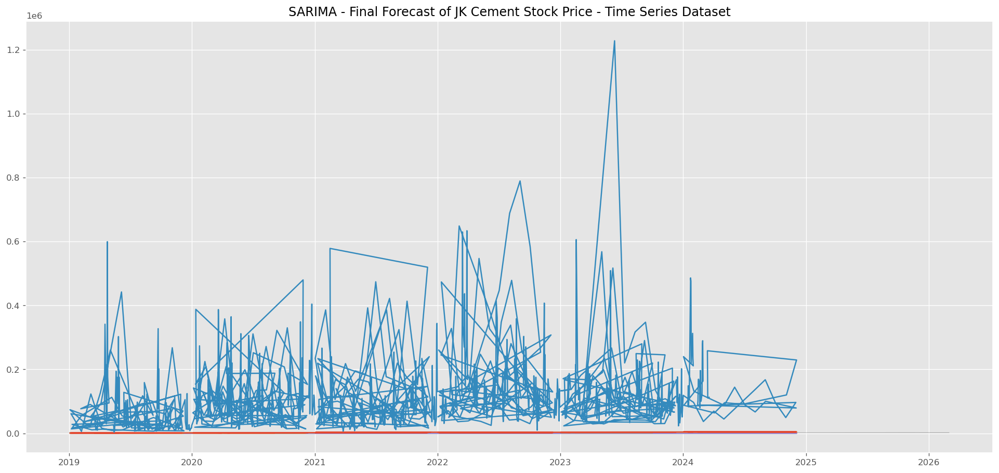

In [139]:
# Forecast

plt.figure(figsize=(20, 9))  # Adjust the values as needed (width, height)
n_periods = 24
fitted, confint = smodel.predict(n_periods=n_periods, return_conf_int=True)
index_of_fc = pd.date_range(df.index[-1], periods = n_periods, freq='MS')

# make series for plotting purpose
fitted_series = pd.Series(fitted, index=index_of_fc)
lower_series = pd.Series(confint[:, 0], index=index_of_fc)
upper_series = pd.Series(confint[:, 1], index=index_of_fc)

# Plot
plt.plot(df)
plt.plot(fitted_series, color='darkgreen')
plt.fill_between(lower_series.index, 
                 lower_series, 
                 upper_series, 
                 color='k', alpha=.15)

plt.title("SARIMA - Final Forecast of JK Cement Stock Price - Time Series Dataset")
plt.show()

# SARIMAX Model with Exogeneous Variables---

In [140]:
# Adding exogenous variable
df['month_index'] = df.index.month

# SARIMAX Model
SARIMAX_model = pm.auto_arima(df['Adj_Close'], exogenous=df[['month_index']],
                           start_p=1, start_q=1,
                           test='adf',
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=True,
                           d=None, D=1, 
                           trace=False,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)


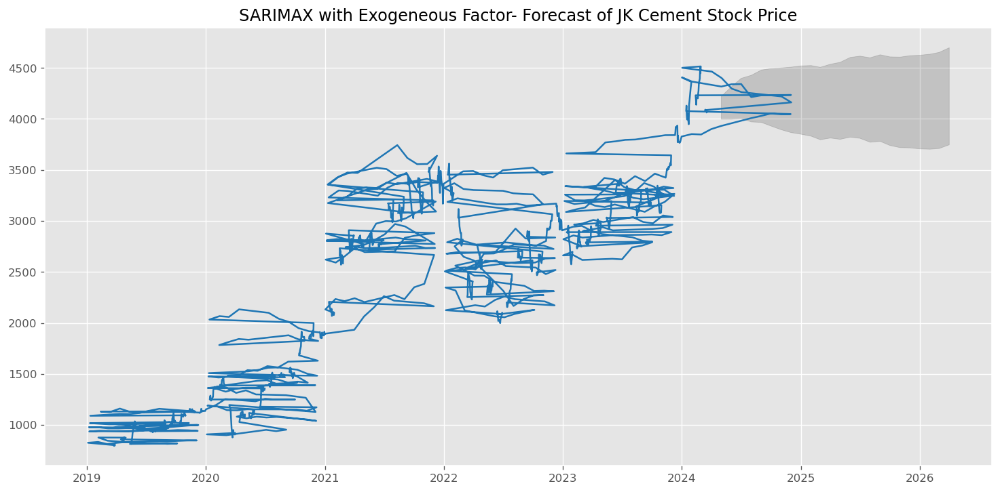

In [143]:
def sarimax_forecast(SARIMAX_model, periods=24):
    # Forecast
    n_periods = periods

    forecast_df = pd.DataFrame({"month_index":pd.date_range(df.index[-1], periods = n_periods, freq='MS').month},
                    index = pd.date_range(df.index[-1] + pd.DateOffset(months=1), periods = n_periods, freq='MS'))

    fitted, confint = SARIMAX_model.predict(n_periods=n_periods, 
                                            return_conf_int=True,
                                            exogenous=forecast_df[['month_index']])
    index_of_fc = pd.date_range(df.index[-1] + pd.DateOffset(months=1), periods = n_periods, freq='MS')
    
    # make series for plotting purpose
    fitted_series = pd.Series(fitted, index=index_of_fc)
    lower_series = pd.Series(confint[:, 0], index=index_of_fc)
    upper_series = pd.Series(confint[:, 1], index=index_of_fc)

    # Plot
    plt.figure(figsize=(15,7))
    plt.plot(df["Adj_Close"], color='#1f76b4')
    plt.plot(fitted_series, color='darkgreen')
    plt.fill_between(lower_series.index, 
                    lower_series, 
                    upper_series, 
                    color='k', alpha=.15)

    plt.title("SARIMAX with Exogeneous Factor- Forecast of JK Cement Stock Price")
    plt.show()

sarimax_forecast(SARIMAX_model, periods=24)

In [142]:
SARIMAX_model = pm.auto_arima(df['Adj_Close'], exogenous=df[['month_index']],
                           start_p=1, start_q=1,
                           test='adf',
                           max_p=3, max_q=3, m=12,
                           start_P=0, seasonal=True,
                           d=None, D=1, 
                           trace=False,
                           error_action='ignore',  
                           suppress_warnings=True, 
                           stepwise=True)
SARIMAX_model

ARIMA(order=(3, 0, 2), scoring_args={}, seasonal_order=(2, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [144]:
train_size = int(len(df['Adj_Close']) * 0.7)  # 80% of data for training
train_data = df['Adj_Close'][:train_size]
test_data = df['Adj_Close'][train_size:]

In [145]:
SARIMAX_model.fit(train_data)

ARIMA(order=(3, 0, 2), scoring_args={}, seasonal_order=(2, 1, 0, 12),
      suppress_warnings=True, with_intercept=False)

In [146]:
forecast = SARIMAX_model.predict(len(test_data))  # Forecast using the model
forecast.head (10)

863    2878.691209
864    2904.817347
865    2900.760216
866    2900.588051
867    2890.100380
868    2910.752104
869    2938.680326
870    2960.177005
871    2910.364581
872    2896.660497
dtype: float64

In [147]:
forecast.tail (10)

1224    2960.526612
1225    2941.173168
1226    2937.027607
1227    2928.348765
1228    2940.516381
1229    2977.884685
1230    3010.659381
1231    2946.866425
1232    2937.318936
1233    2931.085360
dtype: float64

In [148]:
# Calculate the total sum of squares (TSS)
tss = np.sum((test_data - np.mean(test_data))**2)

# Calculate the residual sum of squares (RSS)
rss = np.sum((test_data - forecast)**2)

# Calculate R-squared (R2)
r_squared = 1 - (rss / tss)
print("R-squared (R2):", r_squared)


# Assuming 'test_data' contains the actual values and 'forecast' contains the predicted values
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(test_data, forecast))
print("Root Mean Squared Error (RMSE):", rmse)

# Calculate Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((test_data - forecast) / test_data)) * 100
print("Mean Absolute Percentage Error (MAPE):", mape)

R-squared (R2): 1.0
Root Mean Squared Error (RMSE): 564.6167242131904
Mean Absolute Percentage Error (MAPE): nan
